In [1]:
import scanpy as sc
import pandas as pd
from matplotlib import pylab
import random
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os
import itertools
import plotly.express as px
import yaml


import numpy as np
import random
import anndata as ad
from scipy.sparse import  csr_matrix, issparse
from scipy import sparse

from matplotlib.colors import TwoSlopeNorm

import scanpy.external as sce
import sys

import scvelo as scv

In [2]:
import anndata
import rapids_singlecell as rsc

In [3]:
import anndata

from pathlib import Path
try:
    nb_fname = ipynbname.name()
except:
    nb_fname = os.path.basename(globals()["__vsc_ipynb_file__"])
    print(nb_fname)

10.2_Hormones_substudy_LineMagnification_Neurons.ipynb


In [ ]:

sc.settings.set_figure_params(dpi=100, facecolor='white', dpi_save=500)
pylab.rcParams['figure.figsize'] = (9, 9)
homeDir = os.getenv("HOME")
sys.path.insert(1, homeDir+"/utils/")

from PlotPCA_components import *
from AtlasClasses import *
DS="hormones_substudy"
celltype="Neurons"
ReferenceTissue="cortex"

with open(homeDir+"/utils/ReferenceDict.yaml", 'r') as file:
    ReferencePaths = yaml.safe_load(file)
    for k in list(ReferencePaths.keys()):
        ReferencePaths[k]["adataPath"] = "/group/testa/Users/davide.castaldi/Polaroids_spinoff"+ReferencePaths[k]["adataPath"]
        #ReferencePaths[k]["signaturePath"] = homeDir+ReferencePaths[k]["signaturePath"]
        ReferencePaths[k]["signaturePath"] = "/group/testa/Users/davide.castaldi/Polaroids_spinoff"+ReferencePaths[k]["signaturePath"]
        ReferencePaths[k]["signaturePurityPath"] = "/group/testa/Users/davide.castaldi/Polaroids_spinoff"+ReferencePaths[k]["signaturePurityPath"]


sc.settings.set_figure_params(dpi=80, facecolor='white', dpi_save=500)
pylab.rcParams['figure.figsize'] = (6, 6)
dir_path = homeDir+"/adatas/{}_ByMacroCelltype".format(DS)


# Import

In [5]:
pcs=15
n_neighbors=30
seed = 437

In [ ]:
adata = sc.read_h5ad(dir_path+"/{}.{}.h5ad".format(DS,celltype))
adata

AnnData object with n_obs × n_vars = 120550 × 36601
    obs: 'tags', 'cmo', 'condition', 'replicate', 'condition_clean', 'line', 'run', 'sample_id', 'groupCov', 'harmonizedRegion', 'tissue', 'PCW', 'Singlet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'log_pct_counts_hb', 'log_total_counts', 'study', 'hormones_substudy', 'EDCs_substudy', 'controls_substudy', 'region', 'study_Annotation', 'ingestdLabels', 'scANVILabels', 'harmonyLabels', 'phase', 'S_score', 'G2M_score', 'Consensus_nIntersection', 'Consensus', 'Consensus_call', 'PassedQCfilt_ScoreSignature_Hypoxia', 'PassedQCfilt_ScoreSignature_ER_stress', 'PassedQCfilt_ScoreSignature_necr

In [7]:
# Clean ribo, mito anmd sec genes

# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata = adata[:,~adata.var_names.str.startswith("MT-")].copy()
# ribosomal genes
adata = adata[:,~adata.var_names.str.startswith(("RPS", "RPL"))].copy()

# Sex genes
print(adata)
adata = adata[:,~adata.var_names.isin(pd.read_csv(homeDir+"/resources/X.genes.tsv", header=None)[0].tolist())].copy()
adata = adata[:,~adata.var_names.isin(pd.read_csv(homeDir+"/resources/Y.genes.tsv", header=None)[0].tolist())].copy()
print(adata)

# Re-normalize
adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata, 20000)
sc.pp.log1p(adata)
adata.layers["logNorm"] = adata.X.copy()



AnnData object with n_obs × n_vars = 120550 × 36485
    obs: 'tags', 'cmo', 'condition', 'replicate', 'condition_clean', 'line', 'run', 'sample_id', 'groupCov', 'harmonizedRegion', 'tissue', 'PCW', 'Singlet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'log_pct_counts_hb', 'log_total_counts', 'study', 'hormones_substudy', 'EDCs_substudy', 'controls_substudy', 'region', 'study_Annotation', 'ingestdLabels', 'scANVILabels', 'harmonyLabels', 'phase', 'S_score', 'G2M_score', 'Consensus_nIntersection', 'Consensus', 'Consensus_call', 'PassedQCfilt_ScoreSignature_Hypoxia', 'PassedQCfilt_ScoreSignature_ER_stress', 'PassedQCfilt_ScoreSignature_necr

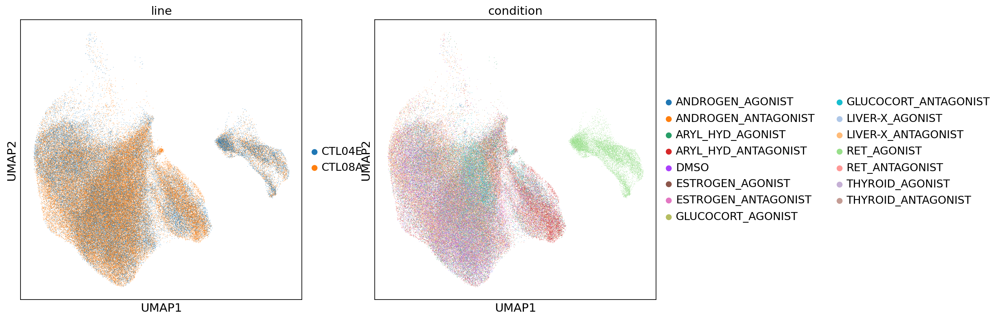

In [8]:
sc.pl.umap(adata, color=["line","condition"])

In [9]:
adata.obs["condition"].value_counts()

condition
ARYL_HYD_ANTAGONIST     12227
ANDROGEN_ANTAGONIST     10305
LIVER-X_AGONIST          9230
ARYL_HYD_AGONIST         8562
ESTROGEN_AGONIST         8322
RET_AGONIST              8321
THYROID_ANTAGONIST       8216
LIVER-X_ANTAGONIST       8199
GLUCOCORT_ANTAGONIST     7743
DMSO                     7001
GLUCOCORT_AGONIST        6965
ANDROGEN_AGONIST         6845
THYROID_AGONIST          6714
ESTROGEN_ANTAGONIST      6420
RET_ANTAGONIST           5480
Name: count, dtype: int64

# In this case we aim to preserve line differences

## Re-run HVGs selection dimreduction and integration 

In [10]:
HVGSCondict = {}
for line in adata.obs["line"].unique().tolist():
    adataGenotype = adata[adata.obs["line"] == line]
    for condition in adataGenotype.obs["condition"].unique().tolist():
        adataCOnd = adataGenotype[adataGenotype.obs["condition"] == condition].copy()

        if condition not in list(HVGSCondict.keys()):
            HVGSCondict[condition] = []

        #Print Nsamples
        nsamples = len(adataCOnd.obs["sample_id"].unique().tolist())
        print(f"Found {nsamples} repliacates for {line} {condition}")
        if nsamples < 3:
            minOverlap = nsamples
        else:
            minOverlap = nsamples-1
        print(f"Only HVGs common to {minOverlap} replicates will be kept")

        sc.pp.highly_variable_genes(adataCOnd, batch_key="sample_id", flavor="seurat", n_top_genes=1000)
        CommonHVGs = set(adataCOnd.var_names[adataCOnd.var["highly_variable_nbatches"] >= minOverlap])
        nHVGs = len(CommonHVGs)
        print(f"Found {nHVGs} common HVGs across {minOverlap} replicates for line {line} exposure {condition} ")
        print("\n")
        HVGSCondict[condition].append(CommonHVGs)

Found 3 repliacates for CTL04E ESTROGEN_AGONIST
Only HVGs common to 2 replicates will be kept
Found 552 common HVGs across 2 replicates for line CTL04E exposure ESTROGEN_AGONIST 


Found 3 repliacates for CTL04E ESTROGEN_ANTAGONIST
Only HVGs common to 2 replicates will be kept
Found 553 common HVGs across 2 replicates for line CTL04E exposure ESTROGEN_ANTAGONIST 




Found 3 repliacates for CTL04E ANDROGEN_AGONIST
Only HVGs common to 2 replicates will be kept
Found 512 common HVGs across 2 replicates for line CTL04E exposure ANDROGEN_AGONIST 


Found 3 repliacates for CTL04E ANDROGEN_ANTAGONIST
Only HVGs common to 2 replicates will be kept
Found 545 common HVGs across 2 replicates for line CTL04E exposure ANDROGEN_ANTAGONIST 


Found 3 repliacates for CTL04E ARYL_HYD_AGONIST
Only HVGs common to 2 replicates will be kept
Found 573 common HVGs across 2 replicates for line CTL04E exposure ARYL_HYD_AGONIST 


Found 3 repliacates for CTL04E ARYL_HYD_ANTAGONIST
Only HVGs common to 2 replicates will be kept
Found 674 common HVGs across 2 replicates for line CTL04E exposure ARYL_HYD_ANTAGONIST 


Found 3 repliacates for CTL04E LIVER-X_AGONIST
Only HVGs common to 2 replicates will be kept
Found 552 common HVGs across 2 replicates for line CTL04E exposure LIVER-X_AGONIST 


Found 3 repliacates for CTL04E LIVER-X_ANTAGONIST
Only HVGs common to 2 replicates wi

# 2) Inter-condition DEGs by line Seurat flavour

In [11]:

sc.pp.highly_variable_genes(adata, batch_key="line", flavor="seurat", n_top_genes=1000)
HVGSLine = set(adata.var_names[adata.var["highly_variable_nbatches"] >=1].tolist())
nHVGSLine = len(HVGSLine)
print(f"Found {nHVGSLine} common pan-condition HVGs across both lines ")



Found 1601 common pan-condition HVGs across both lines 


## 3) Combine both HVGs sets

In [12]:

##### First HVGs set
##### First HVGs set

IntersectionDEGs = []
for k in list(HVGSCondict.keys()):
    IntersectionDEGsCond = list(set.union(*HVGSCondict[k]))
    nIntersectionDEGsCond = len(IntersectionDEGsCond)
    #print(f"Found {nIntersectionDEGsCond} HVGs from the intersection of both genotypes replicates for exposure {condition} ")
    IntersectionDEGs.extend(IntersectionDEGsCond)

IntersectionDEGs = set(IntersectionDEGs)
nIntersectionDEGsCond = len(IntersectionDEGs)
print(f"Found {nIntersectionDEGsCond} HVGs from the union of both genotypes replicates for exposure {condition} ")

##### Second HVGs set
##### Second HVGs set

FinalHVGs = list(IntersectionDEGs.union(HVGSLine))
nFinalHVGs = len(FinalHVGs)
print(f"Found {nFinalHVGs} HVGs from the union of both genotypes replicates and across exposures ")


Found 3998 HVGs from the union of both genotypes replicates for exposure RET_ANTAGONIST 
Found 4608 HVGs from the union of both genotypes replicates and across exposures 


# Store HVGs and run dimreduct



In [13]:
adata

AnnData object with n_obs × n_vars = 120550 × 35477
    obs: 'tags', 'cmo', 'condition', 'replicate', 'condition_clean', 'line', 'run', 'sample_id', 'groupCov', 'harmonizedRegion', 'tissue', 'PCW', 'Singlet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'log_pct_counts_hb', 'log_total_counts', 'study', 'hormones_substudy', 'EDCs_substudy', 'controls_substudy', 'region', 'study_Annotation', 'ingestdLabels', 'scANVILabels', 'harmonyLabels', 'phase', 'S_score', 'G2M_score', 'Consensus_nIntersection', 'Consensus', 'Consensus_call', 'PassedQCfilt_ScoreSignature_Hypoxia', 'PassedQCfilt_ScoreSignature_ER_stress', 'PassedQCfilt_ScoreSignature_necr

In [14]:
adata.var["highly_variable_seurat_overlap"] = adata.var_names.isin(FinalHVGs)
print(adata.var["highly_variable_seurat_overlap"].sum())
adata.var["highly_variable"] = adata.var["highly_variable_seurat_overlap"]
sc.pp.scale(adata)
adata.layers["scaled"] = adata.X.copy()
sc.pp.pca(adata, use_highly_variable=True)
sc.pp.neighbors(adata, n_pcs=pcs, n_neighbors=n_neighbors, random_state=seed)
adata.X = adata.layers["logNorm"].copy()


4608


In [15]:
sc.tl.umap(adata, random_state=seed)


In [ ]:
sc.tl.draw_graph(adata)

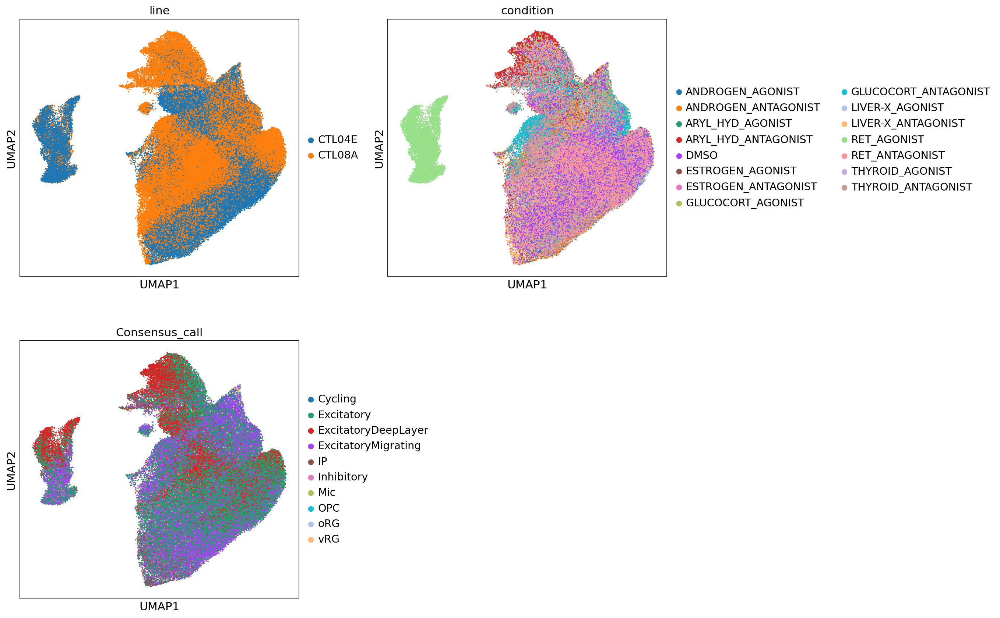

In [ ]:

sc.pl.umap(adata, color=["line","condition","Consensus_call"], size=10, vmin='p1', vmax='p99', wspace=.2, ncols=2)

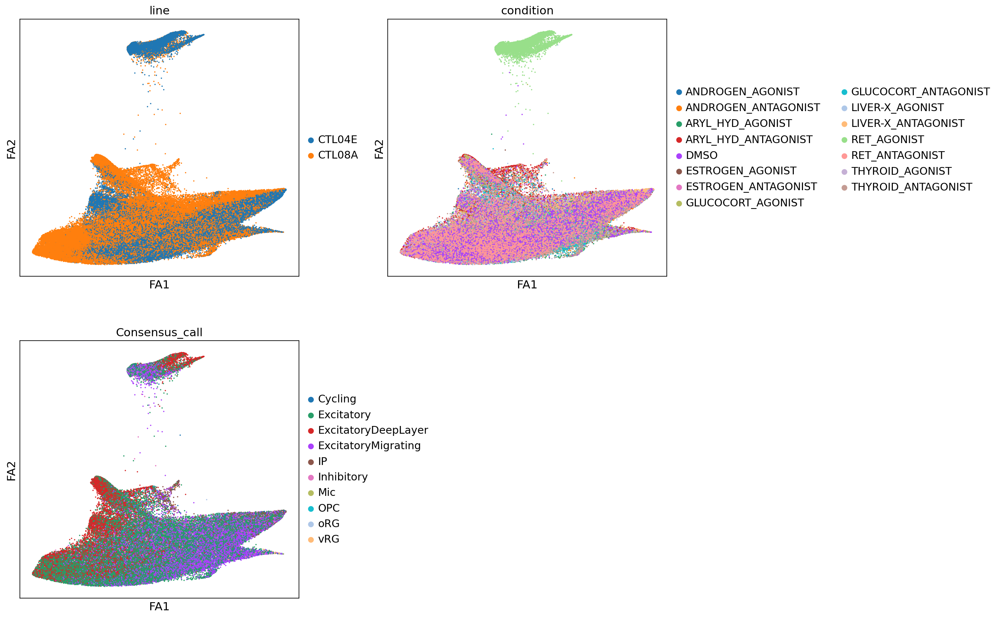

In [ ]:
sc.pl.draw_graph(adata, color=["line","condition","Consensus_call"], size=10, vmin='p1', vmax='p99', wspace=.2, ncols=2)

In [ ]:
print(adata.X.max())
print(adata.X.min())

In [42]:
del adata.layers["scaled"]
del adata.layers["logNorm"]

In [43]:
# Store results

adata.write_h5ad(dir_path+"/{}.{}.LineMagnification.h5ad".format(DS,celltype))

In [7]:
adata = sc.read_h5ad(dir_path+"/{}.{}.LineMagnification.h5ad".format(DS,celltype))

# Differential expression

In [8]:
adataPbulk = adata.copy()
adataPbulk.obs["line_condition"] = adataPbulk.obs["line"].astype(str)+"_"+ adataPbulk.obs["condition"].astype(str)

## **The following chunk is used to balance cells across covariates, it is now commented since edgeR pbulk approach should also mitigate  this imbalance through its normalization**



import hashlib
Xtab = pd.crosstab(adataPbulk.obs["condition"],adataPbulk.obs["line"])
print(Xtab)
minCells = Xtab.min().min()
Compositionhash = hashlib.sha256(Xtab.sort_index(axis=1).to_csv(index=True).encode('utf-8')).hexdigest()



SelectedCells = []
SelectedCellsFile = "./{}.{}.selectedBCs.txt".format(nb_fname,Compositionhash)
if os.path.isfile(SelectedCellsFile):
    print("Loading existing cells subset")
    SelectedCells = pd.read_csv(SelectedCellsFile)["0"].tolist()
else:
    print("File not found or compositions are changed, performing downsampling to balance conditions/lines")
    for line in adataPbulk.obs["line_condition"].unique():
        pbulkCond = adataPbulk[(adataPbulk.obs["line_condition"] == line)]

        pbulkCondCells = random.sample(pbulkCond.obs_names.tolist(), minCells)
        SelectedCells.extend(pbulkCondCells)
    pd.Series(SelectedCells).to_csv(SelectedCellsFile)

adataPbulk = adataPbulk[SelectedCells]
pd.crosstab(adataPbulk.obs["condition"],adataPbulk.obs["line"])

In [9]:
adataPbulk = AtlasTile(adataPbulk, regionObs="harmonizedRegion", tissueObs="tissue", ageObs="PCW", study=DS,scalevar=True, groupCov="groupCov")
adataPbulk.AggregateCounts(method="pseudoBulk", groupcov="sample_id", layer="counts", cellStateObs="condition", prenormalize=False, postnormalize=False)
adataPbulk = adataPbulk.uns["pseudoBulkadata.layer_counts.by_sample_id_condition"].copy()

Pseudobulking counts for sample 3_CTL04E_491 by condition obs
Pseudobulking counts for sample 2_CTL08A_491 by condition obs
Pseudobulking counts for sample 3_CTL08A_491 by condition obs
Pseudobulking counts for sample 2_CTL04E_491 by condition obs
Pseudobulking counts for sample 1_CTL08A_491 by condition obs
Pseudobulking counts for sample 1_CTL04E_491 by condition obs
Pseudobulking counts for sample 3_CTL04E_492 by condition obs
Pseudobulking counts for sample 1_CTL08A_492 by condition obs
Pseudobulking counts for sample 1_CTL04E_492 by condition obs
Pseudobulking counts for sample 2_CTL04E_492 by condition obs
Pseudobulking counts for sample 2_CTL08A_492 by condition obs
Pseudobulking counts for sample 3_CTL08A_492 by condition obs
Pseudobulking counts for sample 2_CTL08A_493 by condition obs
Pseudobulking counts for sample 3_CTL04E_493 by condition obs
Pseudobulking counts for sample 3_CTL08A_493 by condition obs
Pseudobulking counts for sample 2_CTL04E_493 by condition obs
Pseudobu

In [10]:
def sanitize_strings(value):
    if isinstance(value, str):  # Only process string values
        return (
            value.replace('_', '')  # Replace underscores with spaces
            .replace('-', '')      # Replace hyphens with spaces
            .replace('@', '')       # Example: Remove "@" character
        )
    return value  # Leave non-strings untouched

Counts = adataPbulk.to_df(layer="pseudoBulk_summedCounts").T
MD = adataPbulk.obs[["condition","line"]]
MD["sample"] = MD.index.tolist()

MD = MD.applymap(sanitize_strings).loc[MD.index]
MD

,condition,line,sample
3_CTL04E_491.ESTROGEN_AGONIST,ESTROGENAGONIST,CTL04E,3CTL04E491.ESTROGENAGONIST
2_CTL08A_491.ESTROGEN_AGONIST,ESTROGENAGONIST,CTL08A,2CTL08A491.ESTROGENAGONIST
3_CTL08A_491.ESTROGEN_AGONIST,ESTROGENAGONIST,CTL08A,3CTL08A491.ESTROGENAGONIST
2_CTL04E_491.ESTROGEN_AGONIST,ESTROGENAGONIST,CTL04E,2CTL04E491.ESTROGENAGONIST
1_CTL08A_491.ESTROGEN_AGONIST,ESTROGENAGONIST,CTL08A,1CTL08A491.ESTROGENAGONIST
...,...,...,...
1_CTL08A_509.RET_ANTAGONIST,RETANTAGONIST,CTL08A,1CTL08A509.RETANTAGONIST
3_CTL04E_509.RET_ANTAGONIST,RETANTAGONIST,CTL04E,3CTL04E509.RETANTAGONIST
1_CTL04E_509.RET_ANTAGONIST,RETANTAGONIST,CTL04E,1CTL04E509.RETANTAGONIST
2_CTL04E_509.RET_ANTAGONIST,RETANTAGONIST,CTL04E,2CTL04E509.RETANTAGONIST


In [11]:
%load_ext rpy2.ipython
pd.DataFrame.iteritems = pd.DataFrame.items


In [12]:
%%R -i MD -i Counts
library(edgeR)
library(org.Hs.eg.db)
library(AnnotationDbi)
library(stats)
library(topGO)

R[write to console]: Loading required package: limma

R[write to console]: Loading required package: AnnotationDbi

R[write to console]: Loading required package: stats4

R[write to console]: Loading required package: BiocGenerics

R[write to console]: 
Attaching package: ‘BiocGenerics’


R[write to console]: The following object is masked from ‘package:limma’:

    plotMA


R[write to console]: The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


R[write to console]: The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


R[write to console]: Loading required

In [50]:
MD

,condition,line,sample
3_CTL04E_491.ESTROGEN_AGONIST,ESTROGENAGONIST,CTL04E,3CTL04E491.ESTROGENAGONIST
2_CTL08A_491.ESTROGEN_AGONIST,ESTROGENAGONIST,CTL08A,2CTL08A491.ESTROGENAGONIST
3_CTL08A_491.ESTROGEN_AGONIST,ESTROGENAGONIST,CTL08A,3CTL08A491.ESTROGENAGONIST
2_CTL04E_491.ESTROGEN_AGONIST,ESTROGENAGONIST,CTL04E,2CTL04E491.ESTROGENAGONIST
1_CTL08A_491.ESTROGEN_AGONIST,ESTROGENAGONIST,CTL08A,1CTL08A491.ESTROGENAGONIST
...,...,...,...
1_CTL08A_509.RET_ANTAGONIST,RETANTAGONIST,CTL08A,1CTL08A509.RETANTAGONIST
3_CTL04E_509.RET_ANTAGONIST,RETANTAGONIST,CTL04E,3CTL04E509.RETANTAGONIST
1_CTL04E_509.RET_ANTAGONIST,RETANTAGONIST,CTL04E,1CTL04E509.RETANTAGONIST
2_CTL04E_509.RET_ANTAGONIST,RETANTAGONIST,CTL04E,2CTL04E509.RETANTAGONIST


# 1) Line-shared effects vs DMSO

keep.genes
FALSE  TRUE 
14985 20492 
                                                group lib.size norm.factors
3_CTL04E_491.ESTROGEN_AGONIST         ESTROGENAGONIST  4506223    1.0105022
2_CTL08A_491.ESTROGEN_AGONIST         ESTROGENAGONIST  7880413    1.0371210
3_CTL08A_491.ESTROGEN_AGONIST         ESTROGENAGONIST 10571764    1.0012554
2_CTL04E_491.ESTROGEN_AGONIST         ESTROGENAGONIST  6635653    0.9742494
1_CTL08A_491.ESTROGEN_AGONIST         ESTROGENAGONIST 10075647    1.0146013
1_CTL04E_491.ESTROGEN_AGONIST         ESTROGENAGONIST  6610820    0.9786996
3_CTL04E_492.ESTROGEN_ANTAGONIST   ESTROGENANTAGONIST  6472394    1.0837762
1_CTL08A_492.ESTROGEN_ANTAGONIST   ESTROGENANTAGONIST  8313620    1.0617799
1_CTL04E_492.ESTROGEN_ANTAGONIST   ESTROGENANTAGONIST  5277813    1.0257419
2_CTL04E_492.ESTROGEN_ANTAGONIST   ESTROGENANTAGONIST  6584857    1.0396631
2_CTL08A_492.ESTROGEN_ANTAGONIST   ESTROGENANTAGONIST  5921627    1.0585013
3_CTL08A_492.ESTROGEN_ANTAGONIST   ESTROGENANTAGONI

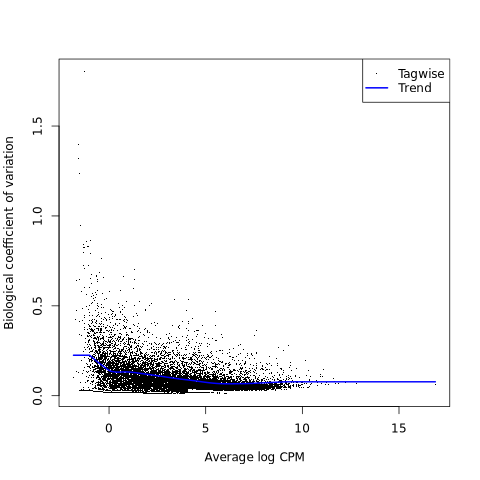

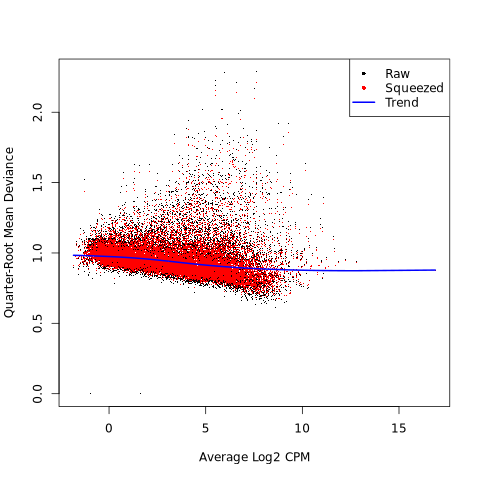

In [51]:
%%R -i MD -i Counts -o MDS


CondFactor <- factor(MD[["condition"]],
                         levels = c("DMSO", setdiff(unique(MD[["condition"]]), "DMSO")))


lineFactor <- factor(MD[["line"]],
                         levels = c("CTL08A","CTL04E"))

mm <- model.matrix(~0+lineFactor+CondFactor )
rownames(mm) <- colnames(Counts)

dds <- DGEList(Counts, group = CondFactor, genes = rownames(Counts))

# Add metadata to dge
dds$samples$line <- lineFactor
dds$samples$nCells <- MD[["nCells"]]

keep.genes<-filterByExpr(dds,design=mm)
print(table(keep.genes))
dds <- dds[keep.genes,, keep.lib.sizes=FALSE]

dds <- calcNormFactors(dds)

# Store MDS
png(tempfile(fileext = ".png"))
MDS <- plotMDS(dds, pch=16,  main="MDS")
dev.off()


#Fit
dds <- estimateGLMRobustDisp(dds, mm)
fit <- glmQLFit(dds, mm)

print(dds$samples)
plotBCV(dds)
plotQLDisp(fit)


## MDS plot

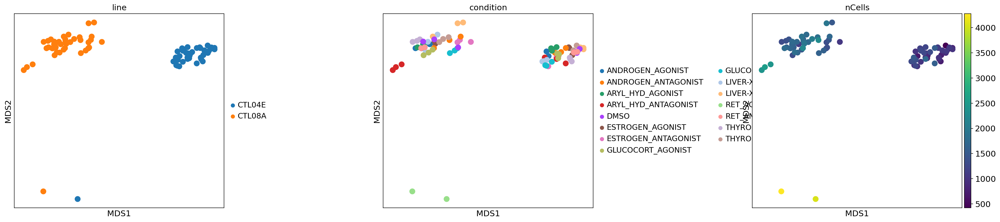

In [52]:
adataPbulk.obsm["MDS"] = np.vstack([MDS["x"],MDS["y"]]).T
sc.pl.embedding(adataPbulk, basis="MDS", color=["line","condition","nCells"], wspace=.6, size=400)

In [53]:
%%R -o SharedConditionVsDmso

AllGenes <- dim(Counts)[1]


SharedConditionVsDmso <- list()

for (condition in setdiff(unique(MD[["condition"]]), "DMSO")) {
    # Construct the contrast expression
    contrastExpression <- paste("CondFactor", condition, sep = "")
    print(contrastExpression)

    # Use the correct argument name 'contrasts' in makeContrasts
    mycontrast <- makeContrasts(contrasts = contrastExpression, levels = mm)
    
    # Remove the extraneous comma and correctly pass all parameters to glmQLFTest
    SharedConditionVsDmso[[paste(condition, ".VS.DMSO",sep = "") ]] <- topTags(glmQLFTest(fit, contrast = mycontrast), adjust.method = "fdr",  n = AllGenes, sort.by = "logFC")$table
    
    # Optionally, print or store the results
}

[1] "CondFactorESTROGENAGONIST"


[1] "CondFactorESTROGENANTAGONIST"
[1] "CondFactorANDROGENAGONIST"
[1] "CondFactorANDROGENANTAGONIST"
[1] "CondFactorARYLHYDAGONIST"
[1] "CondFactorARYLHYDANTAGONIST"
[1] "CondFactorLIVERXAGONIST"
[1] "CondFactorLIVERXANTAGONIST"
[1] "CondFactorGLUCOCORTAGONIST"
[1] "CondFactorGLUCOCORTANTAGONIST"
[1] "CondFactorTHYROIDAGONIST"
[1] "CondFactorTHYROIDANTAGONIST"
[1] "CondFactorRETAGONIST"
[1] "CondFactorRETANTAGONIST"


# 2) Line-shared effects agonist vs antagonists

In [54]:
%%R -o SharedAgonistVsAntagonist

AllGenes <- dim(Counts)[1]


SharedAgonistVsAntagonist <- list()

for (condition in setdiff(unique(MD[["condition"]]), "DMSO")) {
    print(condition)
    # Only process conditions containing "AGONIST"
    if (!grepl("ANTAGONIST", condition)) {
        # Replace "AGONIST" with "ANTAGONIST" in the condition string
        condAntagonist <- gsub("AGONIST", "ANTAGONIST", condition)
        
        # Construct the contrast expression; adjust the separator as needed
        contrastExpression <- paste("CondFactor", condition, "-", "CondFactor", condAntagonist, sep = "")

        # Create the contrast using makeContrasts (ensure mm is defined)
        mycontrast <- makeContrasts(contrasts = contrastExpression, levels = mm)

        # Perform the glmQLFTest and extract the topTags table;
        # ensure AllGenes is defined as the number of genes to report
        
        SharedAgonistVsAntagonist[[paste(condition, ".VS.",condAntagonist,"LineShared",sep = "") ]] <- topTags(glmQLFTest(fit, contrast = mycontrast), 
                                            adjust.method = "fdr", 
                                            n = AllGenes, 
                                            sort.by = "logFC")$table
        
    }
}

[1] "ESTROGENAGONIST"


[1] "ESTROGENANTAGONIST"
[1] "ANDROGENAGONIST"
[1] "ANDROGENANTAGONIST"
[1] "ARYLHYDAGONIST"
[1] "ARYLHYDANTAGONIST"
[1] "LIVERXAGONIST"
[1] "LIVERXANTAGONIST"
[1] "GLUCOCORTAGONIST"
[1] "GLUCOCORTANTAGONIST"
[1] "THYROIDAGONIST"
[1] "THYROIDANTAGONIST"
[1] "RETAGONIST"
[1] "RETANTAGONIST"


# 3) Differential line effects agonist vs antagonist

                                                       group lib.size
3_CTL04E_491.ESTROGEN_AGONIST         CTL04E.ESTROGENAGONIST  4507572
2_CTL08A_491.ESTROGEN_AGONIST         CTL08A.ESTROGENAGONIST  7882953
3_CTL08A_491.ESTROGEN_AGONIST         CTL08A.ESTROGENAGONIST 10574899
2_CTL04E_491.ESTROGEN_AGONIST         CTL04E.ESTROGENAGONIST  6637449
1_CTL08A_491.ESTROGEN_AGONIST         CTL08A.ESTROGENAGONIST 10078775
1_CTL04E_491.ESTROGEN_AGONIST         CTL04E.ESTROGENAGONIST  6612690
3_CTL04E_492.ESTROGEN_ANTAGONIST   CTL04E.ESTROGENANTAGONIST  6474589
1_CTL08A_492.ESTROGEN_ANTAGONIST   CTL08A.ESTROGENANTAGONIST  8316210
1_CTL04E_492.ESTROGEN_ANTAGONIST   CTL04E.ESTROGENANTAGONIST  5279470
2_CTL04E_492.ESTROGEN_ANTAGONIST   CTL04E.ESTROGENANTAGONIST  6586853
2_CTL08A_492.ESTROGEN_ANTAGONIST   CTL08A.ESTROGENANTAGONIST  5923504
3_CTL08A_492.ESTROGEN_ANTAGONIST   CTL08A.ESTROGENANTAGONIST  9515096
2_CTL08A_493.ANDROGEN_AGONIST         CTL08A.ANDROGENAGONIST  5891373
3_CTL04E_493.ANDROGE

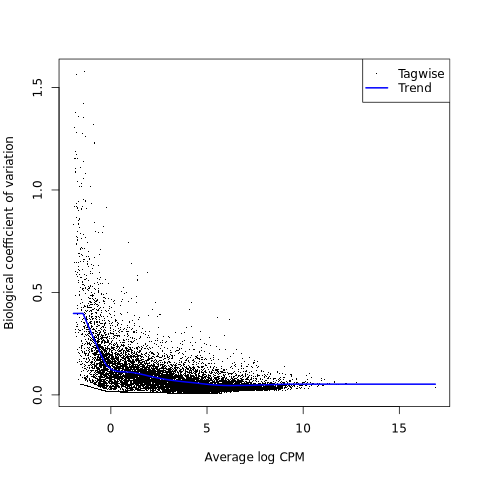

In [13]:
%%R -i MD -i Counts -o MDS

Group <- factor(paste(MD$line,MD$condition,sep="."))
mm <-model.matrix(~0+Group, data=Group)
colnames(mm)<-levels(Group)
rownames(mm)<-rownames(MD)



dds <- DGEList(Counts, group = Group, genes = rownames(Counts))
keep.genes<-filterByExpr(dds,design=mm)
dds <- dds[keep.genes,, keep.lib.sizes=FALSE]
dds <- calcNormFactors(dds)
dds <- estimateGLMRobustDisp(dds, mm)
fit <- glmQLFit(dds, mm)

# Store MDS
png(tempfile(fileext = ".png"))
MDS <- plotMDS(dds, pch=16,  main="MDS")
dev.off()

print(dds$samples)
plotBCV(dds)


In [14]:
%%R -o univserse

univserse <- rownames(dds)

In [15]:
pd.Series(list(univserse)).to_excel("./{}_{}_DEGs/UNIVERSE_DEGsPerLineAgonistVsAntagonist.xlsx".format(DS, celltype))

## MDS plot

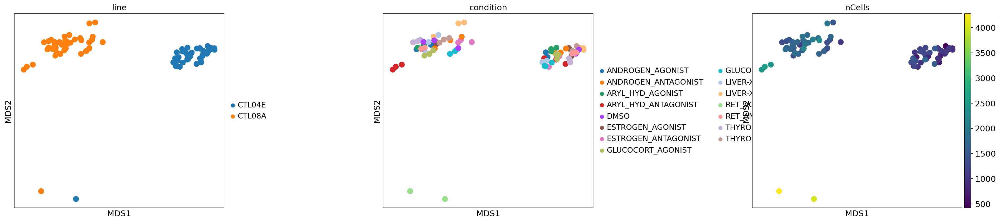

In [56]:
adataPbulk.obsm["MDS"] = np.vstack([MDS["x"],MDS["y"]]).T
sc.pl.embedding(adataPbulk, basis="MDS", color=["line","condition","nCells"], wspace=.6, size=400)

In [57]:
%%R
print(head(mm))
print(colnames(mm))

                              CTL04E.ANDROGENAGONIST CTL04E.ANDROGENANTAGONIST
3_CTL04E_491.ESTROGEN_AGONIST                      0                         0
2_CTL08A_491.ESTROGEN_AGONIST                      0                         0
3_CTL08A_491.ESTROGEN_AGONIST                      0                         0
2_CTL04E_491.ESTROGEN_AGONIST                      0                         0
1_CTL08A_491.ESTROGEN_AGONIST                      0                         0
1_CTL04E_491.ESTROGEN_AGONIST                      0                         0
                              CTL04E.ARYLHYDAGONIST CTL04E.ARYLHYDANTAGONIST
3_CTL04E_491.ESTROGEN_AGONIST                     0                        0
2_CTL08A_491.ESTROGEN_AGONIST                     0                        0
3_CTL08A_491.ESTROGEN_AGONIST                     0                        0
2_CTL04E_491.ESTROGEN_AGONIST                     0                        0
1_CTL08A_491.ESTROGEN_AGONIST                     0           

In [58]:
%%R -o DifferentialEffectAgonistVsAntagonist

AllGenes <- dim(Counts)[1]


DifferentialEffectAgonistVsAntagonist <- list()

for (condition in setdiff(unique(MD[["condition"]]), "DMSO")) {
    # Only process conditions containing "AGONIST"
    if (!grepl("ANTAGONIST", condition)) {
        # Replace "AGONIST" with "ANTAGONIST" in the condition string
        condAntagonist <- gsub("AGONIST", "ANTAGONIST", condition)


        contrastExpression <- paste("(CTL04E.", condition, "-", "CTL04E.", condAntagonist, 
                                      ")-(CTL08A.", condition, "-", "CTL08A.", condAntagonist, ")", 
                                      sep = "")   
        
        print(contrastExpression)
        mycontrast <- makeContrasts(contrasts = contrastExpression, levels = mm)
         
        DifferentialEffectAgonistVsAntagonist[[paste(condition, ".VS.",condAntagonist,"DifferentialCTL04E-CTL08A",sep = "") ]] <- topTags(glmQLFTest(fit, contrast = mycontrast), adjust.method = "fdr",  n = AllGenes, sort.by = "PValue")$table
    
}
}


[1] "(CTL04E.ESTROGENAGONIST-CTL04E.ESTROGENANTAGONIST)-(CTL08A.ESTROGENAGONIST-CTL08A.ESTROGENANTAGONIST)"


[1] "(CTL04E.ANDROGENAGONIST-CTL04E.ANDROGENANTAGONIST)-(CTL08A.ANDROGENAGONIST-CTL08A.ANDROGENANTAGONIST)"
[1] "(CTL04E.ARYLHYDAGONIST-CTL04E.ARYLHYDANTAGONIST)-(CTL08A.ARYLHYDAGONIST-CTL08A.ARYLHYDANTAGONIST)"
[1] "(CTL04E.LIVERXAGONIST-CTL04E.LIVERXANTAGONIST)-(CTL08A.LIVERXAGONIST-CTL08A.LIVERXANTAGONIST)"
[1] "(CTL04E.GLUCOCORTAGONIST-CTL04E.GLUCOCORTANTAGONIST)-(CTL08A.GLUCOCORTAGONIST-CTL08A.GLUCOCORTANTAGONIST)"
[1] "(CTL04E.THYROIDAGONIST-CTL04E.THYROIDANTAGONIST)-(CTL08A.THYROIDAGONIST-CTL08A.THYROIDANTAGONIST)"
[1] "(CTL04E.RETAGONIST-CTL04E.RETANTAGONIST)-(CTL08A.RETAGONIST-CTL08A.RETANTAGONIST)"


# 4) Line-WISE DEGs agonist vs antagonist

In [59]:
%%R -o PerLineAgonistVsAntagonist

AllGenes <- dim(Counts)[1]


PerLineAgonistVsAntagonist <- list()

for (condition in setdiff(unique(MD[["condition"]]), "DMSO")) {
    # Only process conditions containing "AGONIST"
    if (!grepl("ANTAGONIST", condition)) {
        # Replace "AGONIST" with "ANTAGONIST" in the condition string
        condAntagonist <- gsub("AGONIST", "ANTAGONIST", condition)


        contrastExpressionCTL04E <- paste("CTL04E.", condition, "-", "CTL04E.", condAntagonist,sep = "")   
        print(contrastExpressionCTL04E)
        contrastExpressionCTL04E <- makeContrasts(contrasts = contrastExpressionCTL04E, levels = mm)
        PerLineAgonistVsAntagonist[[paste(condition, ".VS.",condAntagonist,"_CTL04E",sep = "") ]] <- topTags(glmQLFTest(fit, contrast = contrastExpressionCTL04E), adjust.method = "fdr",  n = AllGenes, sort.by = "PValue")$table
    
        contrastExpressionCTL08A <- paste("CTL08A.", condition, "-", "CTL08A.", condAntagonist,sep = "")   
        print(contrastExpressionCTL08A)
        contrastExpressionCTL08A <- makeContrasts(contrasts = contrastExpressionCTL08A, levels = mm)
        PerLineAgonistVsAntagonist[[paste(condition, ".VS.",condAntagonist,"_CTL08A",sep = "") ]] <- topTags(glmQLFTest(fit, contrast = contrastExpressionCTL08A), adjust.method = "fdr",  n = AllGenes, sort.by = "PValue")$table
    
}
}

[1] "CTL04E.ESTROGENAGONIST-CTL04E.ESTROGENANTAGONIST"


[1] "CTL08A.ESTROGENAGONIST-CTL08A.ESTROGENANTAGONIST"
[1] "CTL04E.ANDROGENAGONIST-CTL04E.ANDROGENANTAGONIST"
[1] "CTL08A.ANDROGENAGONIST-CTL08A.ANDROGENANTAGONIST"
[1] "CTL04E.ARYLHYDAGONIST-CTL04E.ARYLHYDANTAGONIST"
[1] "CTL08A.ARYLHYDAGONIST-CTL08A.ARYLHYDANTAGONIST"
[1] "CTL04E.LIVERXAGONIST-CTL04E.LIVERXANTAGONIST"
[1] "CTL08A.LIVERXAGONIST-CTL08A.LIVERXANTAGONIST"
[1] "CTL04E.GLUCOCORTAGONIST-CTL04E.GLUCOCORTANTAGONIST"
[1] "CTL08A.GLUCOCORTAGONIST-CTL08A.GLUCOCORTANTAGONIST"
[1] "CTL04E.THYROIDAGONIST-CTL04E.THYROIDANTAGONIST"
[1] "CTL08A.THYROIDAGONIST-CTL08A.THYROIDANTAGONIST"
[1] "CTL04E.RETAGONIST-CTL04E.RETANTAGONIST"
[1] "CTL08A.RETAGONIST-CTL08A.RETANTAGONIST"


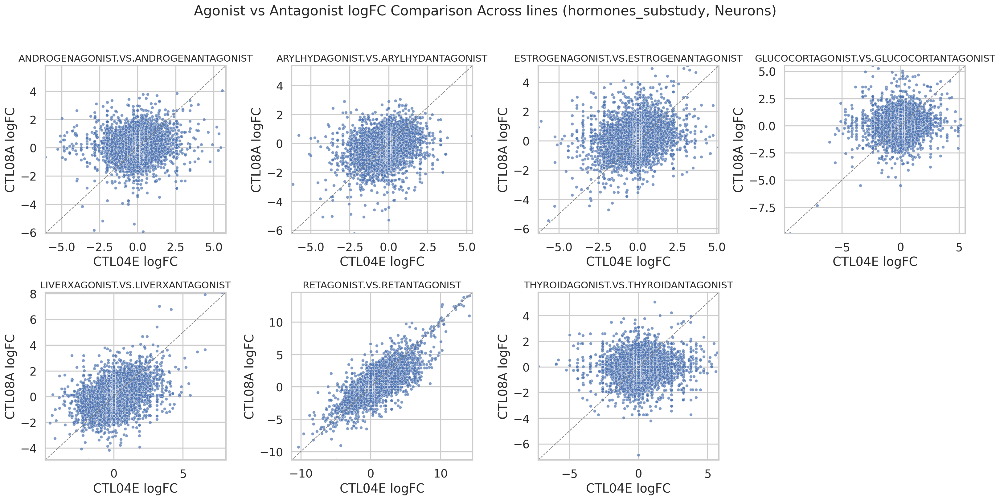

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Prepare compounds list
CompoundsList = sorted(set("_".join(i.split("_")[:-1]) for i in PerLineAgonistVsAntagonist.keys()))

# Set seaborn style
sns.set(style="whitegrid", context="talk")

# Calculate subplot grid size
n = len(CompoundsList)
cols = 4
rows = int(np.ceil(n / cols))

# Create figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
fig.suptitle(f"Agonist vs Antagonist logFC Comparison Across lines ({DS}, {celltype})", fontsize=20, y=1.02)

axes = axes.flatten()

# Loop through compounds and plot
for idx, i in enumerate(CompoundsList):
    ax = axes[idx]
    
    try:
        CTL04Eres = PerLineAgonistVsAntagonist[f"{i}_CTL04E"].copy()
        CTL08Ares = PerLineAgonistVsAntagonist[f"{i}_CTL08A"].copy()

        CTL04Eres = CTL04Eres[["logFC"]].rename(columns={"logFC":"CTL04E logFC"})
        CTL08Ares = CTL08Ares[["logFC"]].rename(columns={"logFC":"CTL08A logFC"})
        merged = pd.concat([CTL04Eres, CTL08Ares], axis=1)

        # Scatterplot
        sns.scatterplot(data=merged, x="CTL04E logFC", y="CTL08A logFC", ax=ax, s=20, alpha=0.7)
        
        # Diagonal line
        lims = [
            np.min([merged["CTL04E logFC"].min(), merged["CTL08A logFC"].min()]),
            np.max([merged["CTL04E logFC"].max(), merged["CTL08A logFC"].max()]),
        ]
        ax.plot(lims, lims, "--", color="gray", linewidth=1)
        ax.set_xlim(lims)
        ax.set_ylim(lims)

        # Titles and labels
        ax.set_title(i, fontsize=14)
        ax.set_xlabel("CTL04E logFC")
        ax.set_ylabel("CTL08A logFC")
    
    except KeyError as e:
        ax.set_visible(False)  # Skip if data is missing

# Hide any unused subplots
for j in range(idx + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


# 5) Line-WISE DEGs condition vs DMSO

In [61]:
%%R -o PerLineConditionVsDMSO

AllGenes <- dim(Counts)[1]


PerLineConditionVsDMSO <- list()

for (condition in setdiff(unique(MD[["condition"]]), "DMSO")) {
    # Only process conditions containing "AGONIST"



    contrastExpressionCTL04E <- paste("CTL04E.", condition, "-", "CTL04E.DMSO",sep = "")   
    print(contrastExpressionCTL04E)
    contrastExpressionCTL04E <- makeContrasts(contrasts = contrastExpressionCTL04E, levels = mm)
    PerLineConditionVsDMSO[[paste(condition, ".VS.DMSO_CTL04E",sep = "") ]] <- topTags(glmQLFTest(fit, contrast = contrastExpressionCTL04E), adjust.method = "fdr",  n = AllGenes, sort.by = "PValue")$table

    contrastExpressionCTL08A <- paste("CTL08A.", condition, "-", "CTL08A.DMSO",sep = "")   
    print(contrastExpressionCTL08A)
    contrastExpressionCTL08A <- makeContrasts(contrasts = contrastExpressionCTL08A, levels = mm)
    PerLineConditionVsDMSO[[paste(condition, ".VS.DMSO_CTL08A",sep = "") ]] <- topTags(glmQLFTest(fit, contrast = contrastExpressionCTL08A), adjust.method = "fdr",  n = AllGenes, sort.by = "PValue")$table
    
}


[1] "CTL04E.ESTROGENAGONIST-CTL04E.DMSO"


[1] "CTL08A.ESTROGENAGONIST-CTL08A.DMSO"
[1] "CTL04E.ESTROGENANTAGONIST-CTL04E.DMSO"
[1] "CTL08A.ESTROGENANTAGONIST-CTL08A.DMSO"
[1] "CTL04E.ANDROGENAGONIST-CTL04E.DMSO"
[1] "CTL08A.ANDROGENAGONIST-CTL08A.DMSO"
[1] "CTL04E.ANDROGENANTAGONIST-CTL04E.DMSO"
[1] "CTL08A.ANDROGENANTAGONIST-CTL08A.DMSO"
[1] "CTL04E.ARYLHYDAGONIST-CTL04E.DMSO"
[1] "CTL08A.ARYLHYDAGONIST-CTL08A.DMSO"
[1] "CTL04E.ARYLHYDANTAGONIST-CTL04E.DMSO"
[1] "CTL08A.ARYLHYDANTAGONIST-CTL08A.DMSO"
[1] "CTL04E.LIVERXAGONIST-CTL04E.DMSO"
[1] "CTL08A.LIVERXAGONIST-CTL08A.DMSO"
[1] "CTL04E.LIVERXANTAGONIST-CTL04E.DMSO"
[1] "CTL08A.LIVERXANTAGONIST-CTL08A.DMSO"
[1] "CTL04E.GLUCOCORTAGONIST-CTL04E.DMSO"
[1] "CTL08A.GLUCOCORTAGONIST-CTL08A.DMSO"
[1] "CTL04E.GLUCOCORTANTAGONIST-CTL04E.DMSO"
[1] "CTL08A.GLUCOCORTANTAGONIST-CTL08A.DMSO"
[1] "CTL04E.THYROIDAGONIST-CTL04E.DMSO"
[1] "CTL08A.THYROIDAGONIST-CTL08A.DMSO"
[1] "CTL04E.THYROIDANTAGONIST-CTL04E.DMSO"
[1] "CTL08A.THYROIDANTAGONIST-CTL08A.DMSO"
[1] "CTL04E.RETAGONIST-CTL04E.DMS

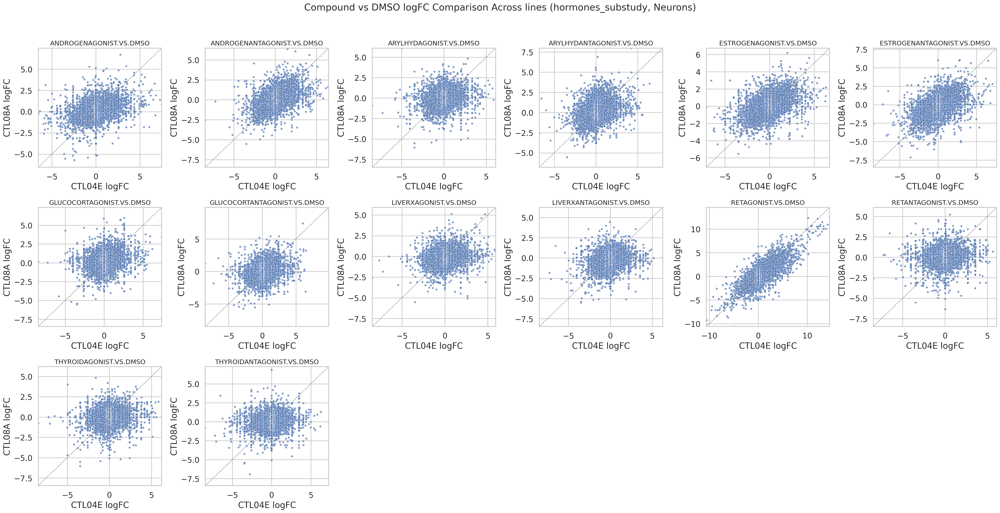

In [62]:
CompoundsList = sorted(set("_".join(i.split("_")[:-1]) for i in PerLineConditionVsDMSO.keys()))

# Set seaborn style
sns.set(style="whitegrid", context="talk")

# Calculate subplot grid size
n = len(CompoundsList)
cols = 6
rows = int(np.ceil(n / cols))

# Create figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
fig.suptitle(f"Compound vs DMSO logFC Comparison Across lines ({DS}, {celltype})", fontsize=20, y=1.02)

axes = axes.flatten()

# Loop through compounds and plot
for idx, i in enumerate(CompoundsList):
    ax = axes[idx]
    
    try:
        CTL04Eres = PerLineConditionVsDMSO[f"{i}_CTL04E"].copy()
        CTL08Ares = PerLineConditionVsDMSO[f"{i}_CTL08A"].copy()

        CTL04Eres = CTL04Eres[["logFC"]].rename(columns={"logFC":"CTL04E logFC"})
        CTL08Ares = CTL08Ares[["logFC"]].rename(columns={"logFC":"CTL08A logFC"})
        merged = pd.concat([CTL04Eres, CTL08Ares], axis=1)

        # Scatterplot
        sns.scatterplot(data=merged, x="CTL04E logFC", y="CTL08A logFC", ax=ax, s=20, alpha=0.7)
        
        # Diagonal line
        lims = [
            np.min([merged["CTL04E logFC"].min(), merged["CTL08A logFC"].min()]),
            np.max([merged["CTL04E logFC"].max(), merged["CTL08A logFC"].max()]),
        ]
        ax.plot(lims, lims, "--", color="gray", linewidth=1)
        ax.set_xlim(lims)
        ax.set_ylim(lims)

        # Titles and labels
        ax.set_title(i, fontsize=14)
        ax.set_xlabel("CTL04E logFC")
        ax.set_ylabel("CTL08A logFC")
    
    except KeyError as e:
        ax.set_visible(False)  # Skip if data is missing

# Hide any unused subplots
for j in range(idx + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

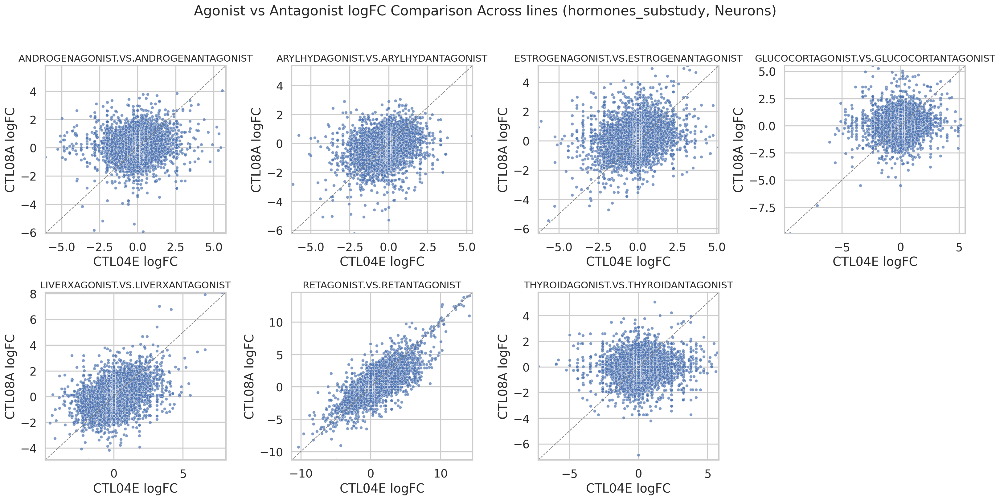

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Prepare compounds list
CompoundsList = sorted(set("_".join(i.split("_")[:-1]) for i in PerLineAgonistVsAntagonist.keys()))

# Set seaborn style
sns.set(style="whitegrid", context="talk")

# Calculate subplot grid size
n = len(CompoundsList)
cols = 4
rows = int(np.ceil(n / cols))

# Create figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
fig.suptitle(f"Agonist vs Antagonist logFC Comparison Across lines ({DS}, {celltype})", fontsize=20, y=1.02)

axes = axes.flatten()

# Loop through compounds and plot
for idx, i in enumerate(CompoundsList):
    ax = axes[idx]
    
    try:
        CTL04Eres = PerLineAgonistVsAntagonist[f"{i}_CTL04E"].copy()
        CTL08Ares = PerLineAgonistVsAntagonist[f"{i}_CTL08A"].copy()

        CTL04Eres = CTL04Eres[["logFC"]].rename(columns={"logFC":"CTL04E logFC"})
        CTL08Ares = CTL08Ares[["logFC"]].rename(columns={"logFC":"CTL08A logFC"})
        merged = pd.concat([CTL04Eres, CTL08Ares], axis=1)

        # Scatterplot
        sns.scatterplot(data=merged, x="CTL04E logFC", y="CTL08A logFC", ax=ax, s=20, alpha=0.7)
        
        # Diagonal line
        lims = [
            np.min([merged["CTL04E logFC"].min(), merged["CTL08A logFC"].min()]),
            np.max([merged["CTL04E logFC"].max(), merged["CTL08A logFC"].max()]),
        ]
        ax.plot(lims, lims, "--", color="gray", linewidth=1)
        ax.set_xlim(lims)
        ax.set_ylim(lims)

        # Titles and labels
        ax.set_title(i, fontsize=14)
        ax.set_xlabel("CTL04E logFC")
        ax.set_ylabel("CTL08A logFC")
    
    except KeyError as e:
        ax.set_visible(False)  # Skip if data is missing

# Hide any unused subplots
for j in range(idx + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


# 6) Differential line effects compound vs DMSO

In [64]:
%%R -o DifferentialEffectCompoundVsDMSO

AllGenes <- dim(Counts)[1]


DifferentialEffectCompoundVsDMSO <- list()

for (condition in setdiff(unique(MD[["condition"]]), "DMSO")) {
    # Only process conditions containing "AGONIST"
        # Replace "AGONIST" with "ANTAGONIST" in the condition string
    condAntagonist <- gsub("AGONIST", "ANTAGONIST", condition)


    contrastExpression <- paste("(CTL04E.", condition, "-", "CTL04E.DMSO)-(CTL08A.", condition, "-", "CTL08A.DMSO)", 
                                    sep = "")   
    
    print(contrastExpression)
    mycontrast <- makeContrasts(contrasts = contrastExpression, levels = mm)
        
    DifferentialEffectCompoundVsDMSO[[paste(condition, ".VS.DMSO.DifferentialCTL04E-CTL08A",sep = "") ]] <- topTags(glmQLFTest(fit, contrast = mycontrast), adjust.method = "fdr",  n = AllGenes, sort.by = "PValue")$table

}

[1] "(CTL04E.ESTROGENAGONIST-CTL04E.DMSO)-(CTL08A.ESTROGENAGONIST-CTL08A.DMSO)"
[1] "(CTL04E.ESTROGENANTAGONIST-CTL04E.DMSO)-(CTL08A.ESTROGENANTAGONIST-CTL08A.DMSO)"
[1] "(CTL04E.ANDROGENAGONIST-CTL04E.DMSO)-(CTL08A.ANDROGENAGONIST-CTL08A.DMSO)"
[1] "(CTL04E.ANDROGENANTAGONIST-CTL04E.DMSO)-(CTL08A.ANDROGENANTAGONIST-CTL08A.DMSO)"
[1] "(CTL04E.ARYLHYDAGONIST-CTL04E.DMSO)-(CTL08A.ARYLHYDAGONIST-CTL08A.DMSO)"
[1] "(CTL04E.ARYLHYDANTAGONIST-CTL04E.DMSO)-(CTL08A.ARYLHYDANTAGONIST-CTL08A.DMSO)"
[1] "(CTL04E.LIVERXAGONIST-CTL04E.DMSO)-(CTL08A.LIVERXAGONIST-CTL08A.DMSO)"
[1] "(CTL04E.LIVERXANTAGONIST-CTL04E.DMSO)-(CTL08A.LIVERXANTAGONIST-CTL08A.DMSO)"
[1] "(CTL04E.GLUCOCORTAGONIST-CTL04E.DMSO)-(CTL08A.GLUCOCORTAGONIST-CTL08A.DMSO)"
[1] "(CTL04E.GLUCOCORTANTAGONIST-CTL04E.DMSO)-(CTL08A.GLUCOCORTANTAGONIST-CTL08A.DMSO)"
[1] "(CTL04E.THYROIDAGONIST-CTL04E.DMSO)-(CTL08A.THYROIDAGONIST-CTL08A.DMSO)"
[1] "(CTL04E.THYROIDANTAGONIST-CTL04E.DMSO)-(CTL08A.THYROIDANTAGONIST-CTL08A.DMSO)"
[1] "(CTL04E.RET

# SaveResults

In [65]:
FDR = 0.05

dir_path = "./{}_{}_DEGs".format(DS, celltype)
if not os.path.exists(dir_path):
    os.makedirs(dir_path)


SharedConditionVsDmso_filtered = {}
for k in list(SharedConditionVsDmso.keys()):
    DEGs = SharedConditionVsDmso[k]
    DEGs[DEGs["FDR"] < FDR].to_excel("./{}_{}_DEGs/SharedCompoundVsDmso.{}_{}_{}.FDR{}.xlsx".format(DS, celltype,k, celltype, DS,FDR))
    SharedConditionVsDmso_filtered[k] = DEGs[DEGs["FDR"] < FDR]

SharedAgonistVsAntagonist_filtered = {}
for k in list(SharedAgonistVsAntagonist.keys()):
    DEGs = SharedAgonistVsAntagonist[k]
    DEGs[DEGs["FDR"] < FDR].to_excel("./{}_{}_DEGs/SharedAgonistVsAntagonist.{}_{}_{}.FDR{}.xlsx".format(DS, celltype,k, celltype, DS,FDR))
    SharedAgonistVsAntagonist_filtered[k] = DEGs[DEGs["FDR"] < FDR]

DifferentialEffectCompoundVsDMSO_filtered = {}
for k in list(DifferentialEffectCompoundVsDMSO.keys()):
    DEGs = DifferentialEffectCompoundVsDMSO[k]
    DEGs[DEGs["FDR"] < FDR].to_excel("./{}_{}_DEGs/DifferentialEffectCompoundVsDMSO.{}_{}_{}.FDR{}.xlsx".format(DS, celltype, k, celltype, DS,FDR))
    DifferentialEffectCompoundVsDMSO_filtered[k] = DEGs[DEGs["FDR"] < FDR]

DifferentialEffectAgonistVsAntagonist_filtered = {}
for k in list(DifferentialEffectAgonistVsAntagonist.keys()):
    DEGs = DifferentialEffectAgonistVsAntagonist[k]
    DEGs[DEGs["FDR"] < FDR].to_excel("./{}_{}_DEGs/DifferentialEffectAgonistVsAntagonist.{}_{}_{}.FDR{}.xlsx".format(DS, celltype, k, celltype, DS,FDR))
    DifferentialEffectAgonistVsAntagonist_filtered[k] = DEGs[DEGs["FDR"] < FDR]

PerLineAgonistVsAntagonist_filtered = {}
for k in list(PerLineAgonistVsAntagonist.keys()):
    DEGs = PerLineAgonistVsAntagonist[k]
    DEGs[DEGs["FDR"] < FDR].to_excel("./{}_{}_DEGs/DEGsPerLineAgonistVsAntagonist.{}_{}_{}.FDR{}.xlsx".format(DS, celltype,k, celltype, DS,FDR))
    PerLineAgonistVsAntagonist_filtered["UP_{}".format(k)] = DEGs[(DEGs["FDR"] < FDR) & (DEGs["logFC"] > 2)]
    PerLineAgonistVsAntagonist_filtered["DOWN_{}".format(k)] = DEGs[(DEGs["FDR"] < FDR) & (DEGs["logFC"] < -2)]

PerLineConditionVsDMSO_filtered = {}
for k in list(PerLineConditionVsDMSO.keys()):
    DEGs = PerLineConditionVsDMSO[k]
    DEGs[DEGs["FDR"] < FDR].to_excel("./{}_{}_DEGs/DEGsPerLineCompoundVsDMSO.{}_{}_{}.FDR{}.xlsx".format(DS, celltype,k, celltype, DS,FDR))
    PerLineConditionVsDMSO_filtered["UP_{}".format(k)] = DEGs[(DEGs["FDR"] < FDR) & (DEGs["logFC"] > 2)]
    PerLineConditionVsDMSO_filtered["DOWN_{}".format(k)] = DEGs[(DEGs["FDR"] < FDR) & (DEGs["logFC"] < -2)]

# Jaccard similarity

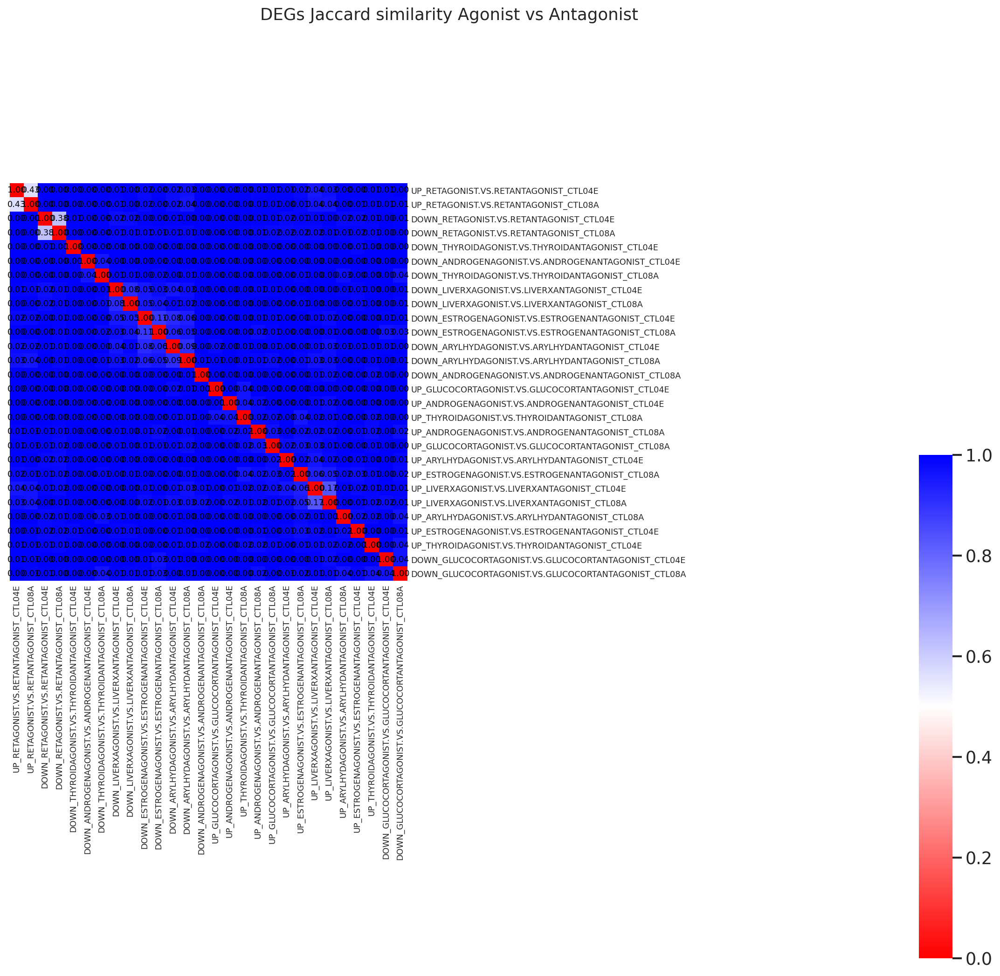

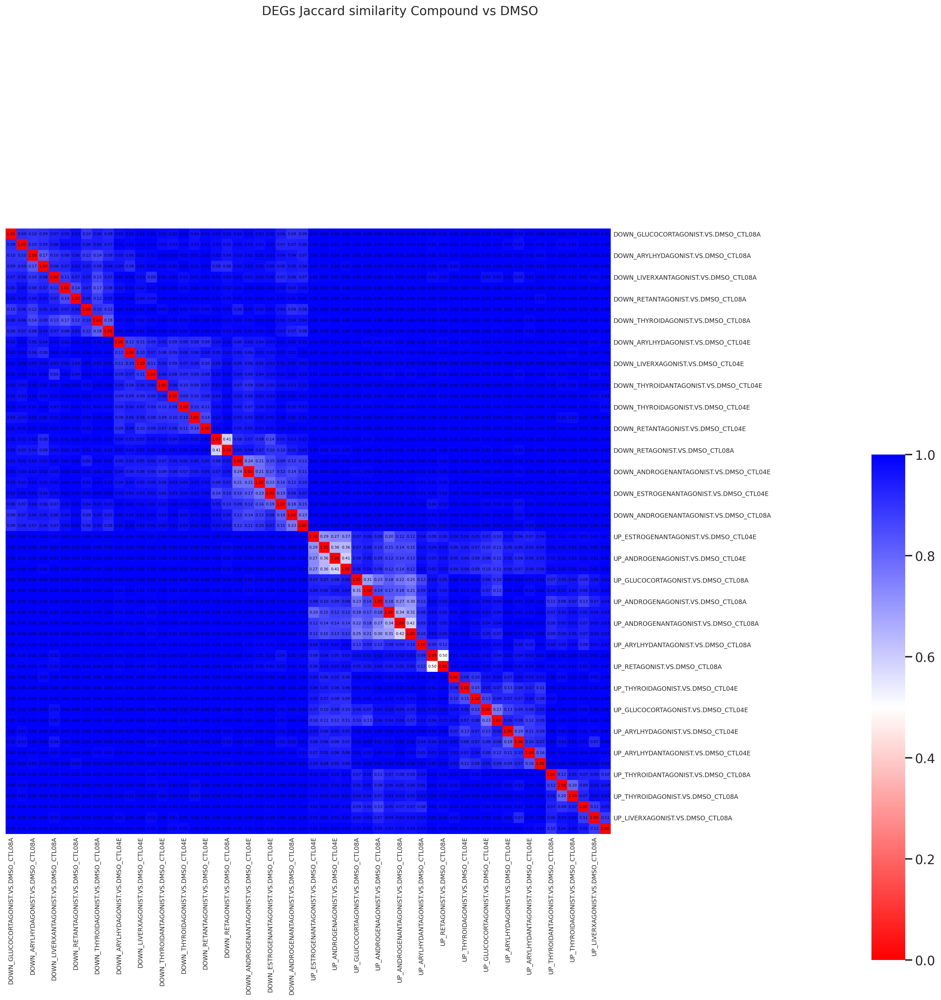

In [66]:

### AGONIST VS ANTAGONIST
### AGONIST VS ANTAGONIST
### AGONIST VS ANTAGONIST
### AGONIST VS ANTAGONIST

JaccardDF = pd.DataFrame(index = list(PerLineAgonistVsAntagonist_filtered.keys()), columns = list(PerLineAgonistVsAntagonist_filtered.keys()))
for combination in list(itertools.combinations(list(PerLineAgonistVsAntagonist_filtered.keys()),2)):
    set0 = set(PerLineAgonistVsAntagonist_filtered[combination[0]].genes.tolist())
    set1 = set(PerLineAgonistVsAntagonist_filtered[combination[1]].genes.tolist())
    Int = set0.intersection(set1)
    Union = set0.union(set1)

    Jaccard = len(Int) / len(Union)
    JaccardDF.loc[combination[0],combination[1]] = Jaccard
    JaccardDF.loc[combination[1],combination[0]] = Jaccard

JaccardDF = JaccardDF.fillna(1)


import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming JaccardDF is your DataFrame of Jaccard similarities
# Convert similarity to distance: distance = 1 - similarity
distance_matrix = 1 - JaccardDF.astype(float)

# Optionally, sort the DataFrame for a canonical order
distance_matrix = distance_matrix.sort_index().sort_index(axis=1)

# Create a clustermap using the 'bwr' colormap with improved aesthetics.
g = sns.clustermap(
    distance_matrix,
    metric="euclidean",      # or 'cityblock', 'cosine', etc.
    method="average",        # clustering method: single, complete, ward, etc.
    cmap="bwr_r",              # blue-white-red palette
    figsize=(15, 15),
    cbar_pos=(0.02, 0.8, 0.05, 0.18)  # adjust colorbar position if needed
)
g.ax_row_dendrogram.set_visible(False)
g.ax_col_dendrogram.set_visible(False)

# The clustermap reorders rows/columns; get the reordered DataFrame.
reordered_data = distance_matrix.iloc[
    g.dendrogram_row.reordered_ind, g.dendrogram_col.reordered_ind
]

# Annotate each cell with the corresponding Jaccard similarity value.
# Note: similarity = 1 - distance
for i, row in enumerate(reordered_data.index):
    for j, col in enumerate(reordered_data.columns):
        d = reordered_data.loc[row, col]
        jaccard_sim = 1 - d  # Convert back to similarity
        g.ax_heatmap.text(
            j + 0.5, i + 0.5,
            f"{jaccard_sim:.2f}",
            ha='center', va='center',
            color='black', fontsize=8
        )

# Remove grid lines from the heatmap
g.ax_heatmap.grid(False)

# Improve overall aesthetics
g.fig.suptitle("DEGs Jaccard similarity Agonist vs Antagonist", fontsize=16, y=1.05)
plt.setp(g.ax_heatmap.xaxis.get_majorticklabels(), rotation=90, fontsize=8)
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0, fontsize=8)
g.ax_heatmap.tick_params(axis='both', which='both', length=0)
g.cax.set_position([.92, .2, .03, .45])  # adjust the colorbar position if needed

plt.show()


### CONDITION VS DMSO
### CONDITION VS DMSO
### CONDITION VS DMSO
### CONDITION VS DMSO

JaccardDF = pd.DataFrame(index = list(PerLineConditionVsDMSO_filtered.keys()), columns = list(PerLineConditionVsDMSO_filtered.keys()))
for combination in list(itertools.combinations(list(PerLineConditionVsDMSO_filtered.keys()),2)):
    set0 = set(PerLineConditionVsDMSO_filtered[combination[0]].genes.tolist())
    set1 = set(PerLineConditionVsDMSO_filtered[combination[1]].genes.tolist())
    Int = set0.intersection(set1)
    Union = set0.union(set1)

    Jaccard = len(Int) / len(Union)
    JaccardDF.loc[combination[0],combination[1]] = Jaccard
    JaccardDF.loc[combination[1],combination[0]] = Jaccard

JaccardDF = JaccardDF.fillna(1)


import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming JaccardDF is your DataFrame of Jaccard similarities
# Convert similarity to distance: distance = 1 - similarity
distance_matrix = 1 - JaccardDF.astype(float)

# Optionally, sort the DataFrame for a canonical order
distance_matrix = distance_matrix.sort_index().sort_index(axis=1)

# Create a clustermap using the 'bwr' colormap with improved aesthetics.
g = sns.clustermap(
    distance_matrix,
    metric="euclidean",      # or 'cityblock', 'cosine', etc.
    method="average",        # clustering method: single, complete, ward, etc.
    cmap="bwr_r",            # blue-white-red palette
    figsize=(20, 20),
    cbar_pos=(0.02, 0.8, 0.05, 0.18)  # adjust colorbar position if needed
)

# Hide the dendrograms (do not display them)
g.ax_row_dendrogram.set_visible(False)
g.ax_col_dendrogram.set_visible(False)

# The clustermap reorders rows/columns; get the reordered DataFrame.
reordered_data = distance_matrix.iloc[
    g.dendrogram_row.reordered_ind, g.dendrogram_col.reordered_ind
]

# Annotate each cell with the corresponding Jaccard similarity value.
# Note: similarity = 1 - distance
for i, row in enumerate(reordered_data.index):
    for j, col in enumerate(reordered_data.columns):
        d = reordered_data.loc[row, col]
        jaccard_sim = 1 - d  # Convert back to similarity
        g.ax_heatmap.text(
            j + 0.5, i + 0.5,
            f"{jaccard_sim:.2f}",
            ha='center', va='center',
            color='black', fontsize=5
        )

# Remove grid lines from the heatmap
g.ax_heatmap.grid(False)

# Improve overall aesthetics
g.fig.suptitle("DEGs Jaccard similarity Compound vs DMSO", fontsize=16, y=1.05)
plt.setp(g.ax_heatmap.xaxis.get_majorticklabels(), rotation=90, fontsize=8)
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0, fontsize=8)
g.ax_heatmap.tick_params(axis='both', which='both', length=0)
g.cax.set_position([.92, .2, .03, .45])  # adjust the colorbar position if needed

plt.show()


# Reproduce the bulk-analyses plot

## Agonist vs antagonist

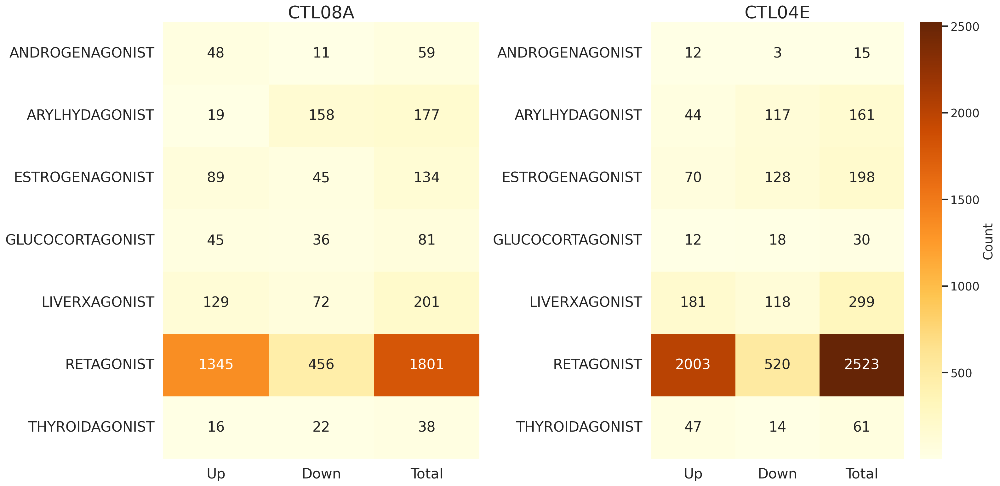

In [67]:
CTL04Eresults = pd.concat([PerLineAgonistVsAntagonist_filtered[k].assign(Line="CTL04E").assign(Group=k) for k in list(PerLineAgonistVsAntagonist_filtered.keys()) if "_CTL04E" in k], ignore_index=True)
CTL04Eresults["Direction"] = CTL04Eresults.Group.str.split("_", expand=True)[0]
CTL04Eresults["Contrast"] = CTL04Eresults.Group.str.split("_", expand=True)[1].str.split(".", expand=True)[0]
CTL04Eresults.groupby(["Contrast","Direction"], as_index=False).size()

CTL04Eresults = CTL04Eresults.groupby('Contrast').apply(lambda group: pd.Series({
    'Up': (group['Direction'] == 'UP').sum(),
    'Down': (group['Direction'] == 'DOWN').sum(),
    'Total': group.shape[0]
})).reset_index()




CTL08Aresults = pd.concat([PerLineAgonistVsAntagonist_filtered[k].assign(Line="CTL08A").assign(Group=k) for k in list(PerLineAgonistVsAntagonist_filtered.keys()) if "_CTL08A" in k], ignore_index=True)
CTL08Aresults["Direction"] = CTL08Aresults.Group.str.split("_", expand=True)[0]
CTL08Aresults["Contrast"] = CTL08Aresults.Group.str.split("_", expand=True)[1].str.split(".", expand=True)[0]
CTL08Aresults.groupby(["Contrast","Direction"], as_index=False).size()

CTL08Aresults = CTL08Aresults.groupby('Contrast').apply(lambda group: pd.Series({
    'Up': (group['Direction'] == 'UP').sum(),
    'Down': (group['Direction'] == 'DOWN').sum(),
    'Total': group.shape[0]
})).reset_index()



import importlib
import matplotlib.pyplot as plt
import seaborn as sns

# Reload matplotlib.pyplot to restore its original state
# Prepare your summary DataFrame indexed by 'Contrast'
summary_results = {}
summary_results["CTL04E"] = CTL04Eresults.set_index('Contrast')[['Up', 'Down', 'Total']]
summary_results["CTL08A"] = CTL08Aresults.set_index('Contrast')[['Up', 'Down', 'Total']]

# Compute global minimum and maximum values across both DataFrames for uniform scaling
global_min = min(df.min().min() for df in summary_results.values())
global_max = max(df.max().max() for df in summary_results.values())

# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Loop through the dictionary keys and plot each heatmap on its corresponding axis
for n, k in enumerate(["CTL08A", "CTL04E"]):
    ax = axes[n]  # get the current axis
    show_cbar = (n == 1)
    sns.heatmap(
        summary_results[k],
        annot=True,
        annot_kws={"size": 20},  # Increase text size here
        fmt="d",
        cmap='YlOrBr',
        linewidths=0,
        linecolor='none',
        vmin=global_min,  # set uniform minimum
        vmax=global_max,  # set uniform maximum
        ax=ax,
        cbar=show_cbar,
        cbar_kws={'label': 'Count'} if show_cbar else None,
    )
    # Remove any visible grid lines by setting the QuadMesh edge color to the face color
    ax.collections[0].set_edgecolor("face")
    ax.grid(False)
    
    # Set the axis labels and title using the axis methods
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelsize=20)
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.set_title(k, fontdict={'size': 25})

# Adjust the layout and display the figure
plt.tight_layout()
plt.show()


## Compound vs DMSO

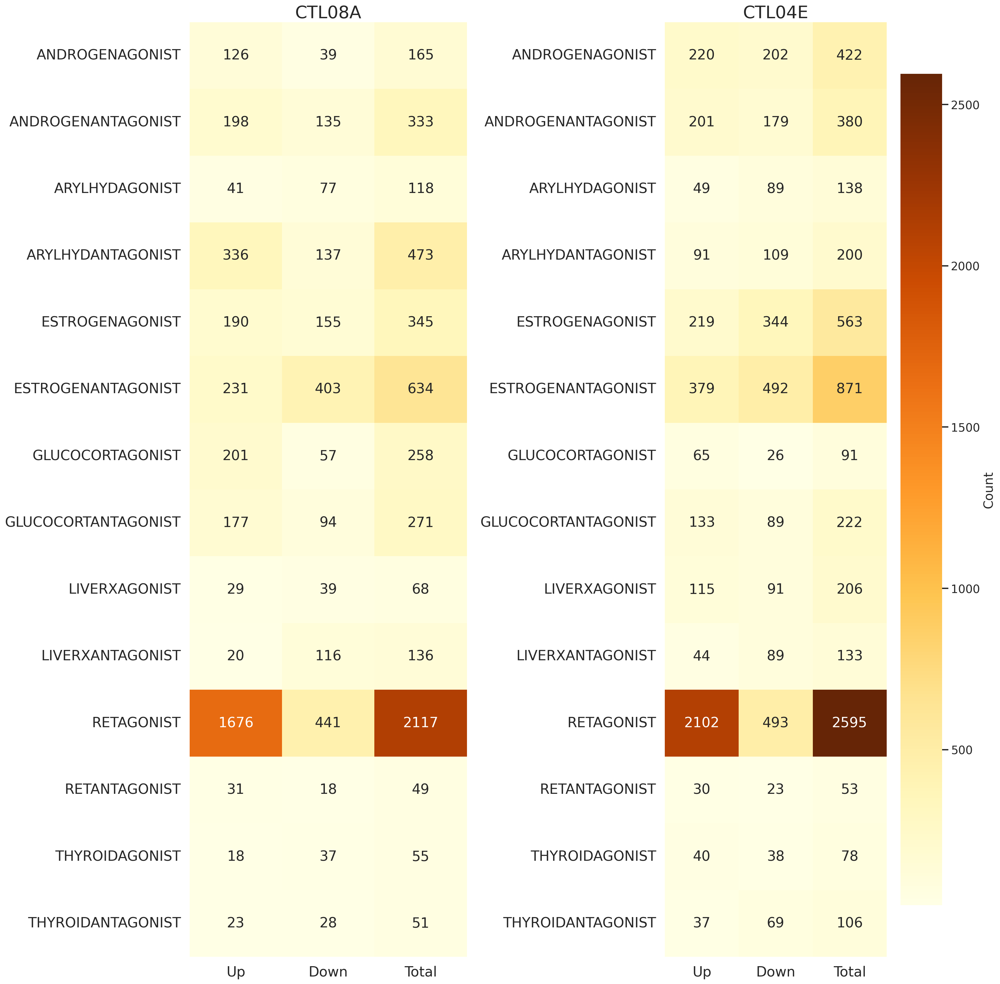

In [68]:
CTL04Eresults = pd.concat([PerLineConditionVsDMSO_filtered[k].assign(Line="CTL04E").assign(Group=k) for k in list(PerLineConditionVsDMSO_filtered.keys()) if "_CTL04E" in k], ignore_index=True)
CTL04Eresults["Direction"] = CTL04Eresults.Group.str.split("_", expand=True)[0]
CTL04Eresults["Contrast"] = CTL04Eresults.Group.str.split("_", expand=True)[1].str.split(".", expand=True)[0]
CTL04Eresults.groupby(["Contrast","Direction"], as_index=False).size()

CTL04Eresults = CTL04Eresults.groupby('Contrast').apply(lambda group: pd.Series({
    'Up': (group['Direction'] == 'UP').sum(),
    'Down': (group['Direction'] == 'DOWN').sum(),
    'Total': group.shape[0]
})).reset_index()




CTL08Aresults = pd.concat([PerLineConditionVsDMSO_filtered[k].assign(Line="CTL08A").assign(Group=k) for k in list(PerLineConditionVsDMSO_filtered.keys()) if "_CTL08A" in k], ignore_index=True)
CTL08Aresults["Direction"] = CTL08Aresults.Group.str.split("_", expand=True)[0]
CTL08Aresults["Contrast"] = CTL08Aresults.Group.str.split("_", expand=True)[1].str.split(".", expand=True)[0]
CTL08Aresults.groupby(["Contrast","Direction"], as_index=False).size()

CTL08Aresults = CTL08Aresults.groupby('Contrast').apply(lambda group: pd.Series({
    'Up': (group['Direction'] == 'UP').sum(),
    'Down': (group['Direction'] == 'DOWN').sum(),
    'Total': group.shape[0]
})).reset_index()

# Reload matplotlib.pyplot to restore its original state
importlib.reload(plt)

# Prepare your summary DataFrame indexed by 'Contrast'
summary_results = {}
summary_results["CTL04E"] = CTL04Eresults.set_index('Contrast')[['Up', 'Down', 'Total']]
summary_results["CTL08A"] = CTL08Aresults.set_index('Contrast')[['Up', 'Down', 'Total']]

# Compute global minimum and maximum values across both DataFrames for uniform scaling
global_min = min(df.min().min() for df in summary_results.values())
global_max = max(df.max().max() for df in summary_results.values())

# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 20))

# Loop through the dictionary keys and plot each heatmap on its corresponding axis
for n, k in enumerate(["CTL08A", "CTL04E"]):
    ax = axes[n]  # get the current axis
    show_cbar = (n == 1)
    sns.heatmap(
        summary_results[k],
        annot=True,
        annot_kws={"size": 20},  # Increase text size here
        fmt="d",
        cmap='YlOrBr',
        linewidths=0,
        linecolor='none',
        vmin=global_min,  # set uniform minimum
        vmax=global_max,  # set uniform maximum
        ax=ax,
        cbar=show_cbar,
        cbar_kws={'label': 'Count'} if show_cbar else None,
    )
    # Remove any visible grid lines by setting the QuadMesh edge color to the face color
    ax.collections[0].set_edgecolor("face")
    ax.grid(False)
    
    # Set the axis labels and title using the axis methods
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelsize=20)
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.set_title(k, fontdict={'size': 25})

# Adjust the layout and display the figure
plt.tight_layout()
plt.show()


# Explore differentially regulated genes per exposure

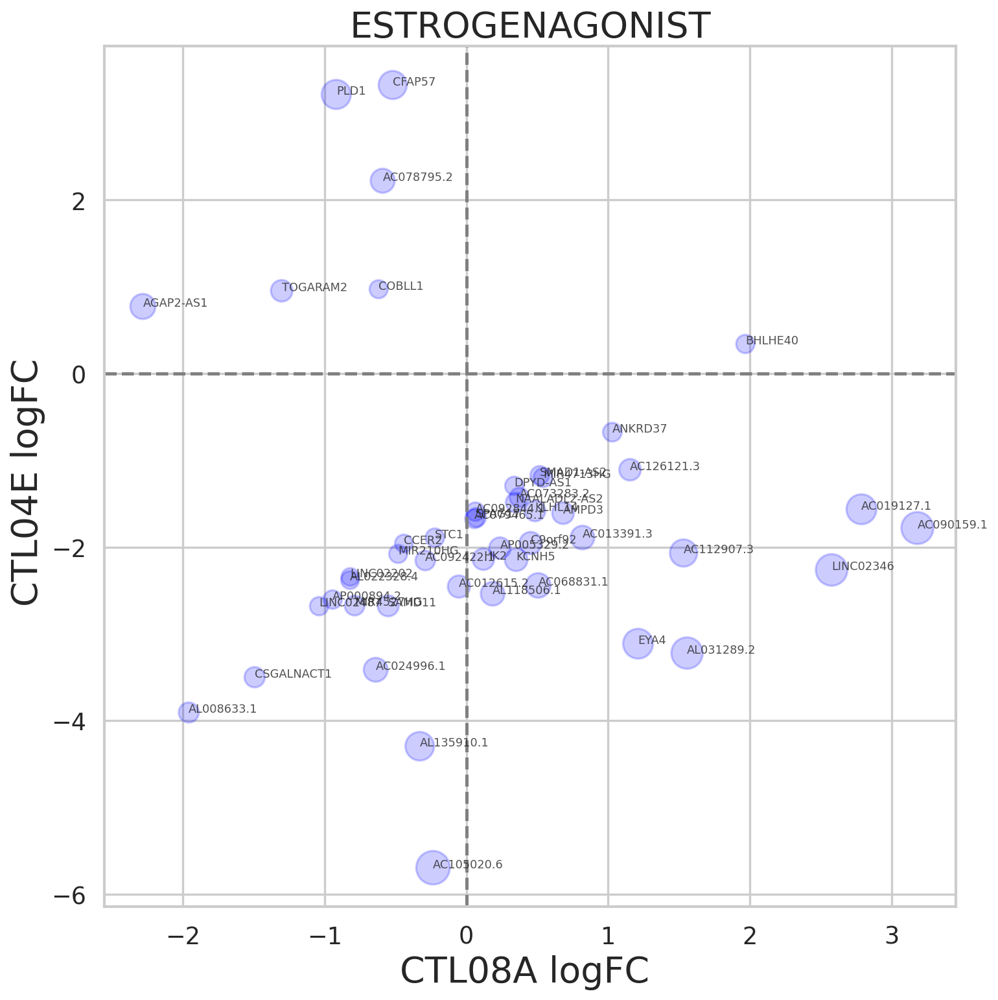

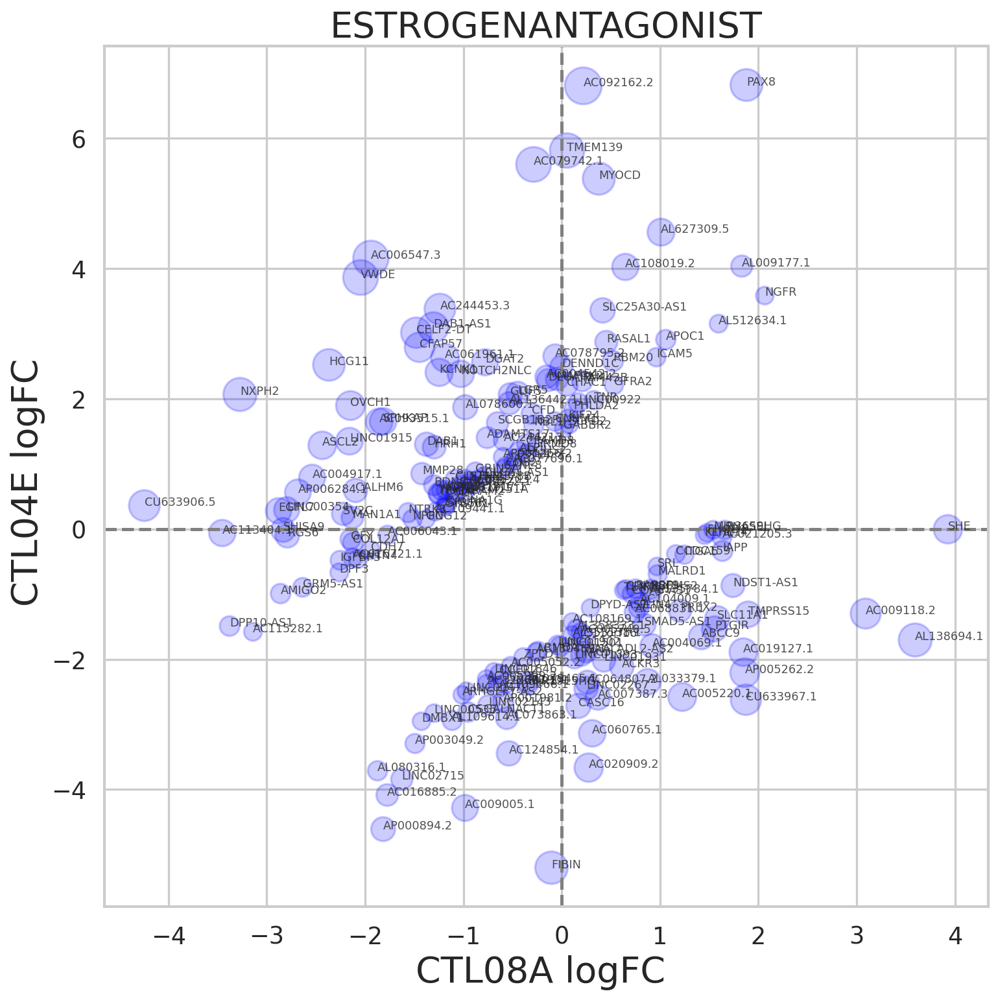

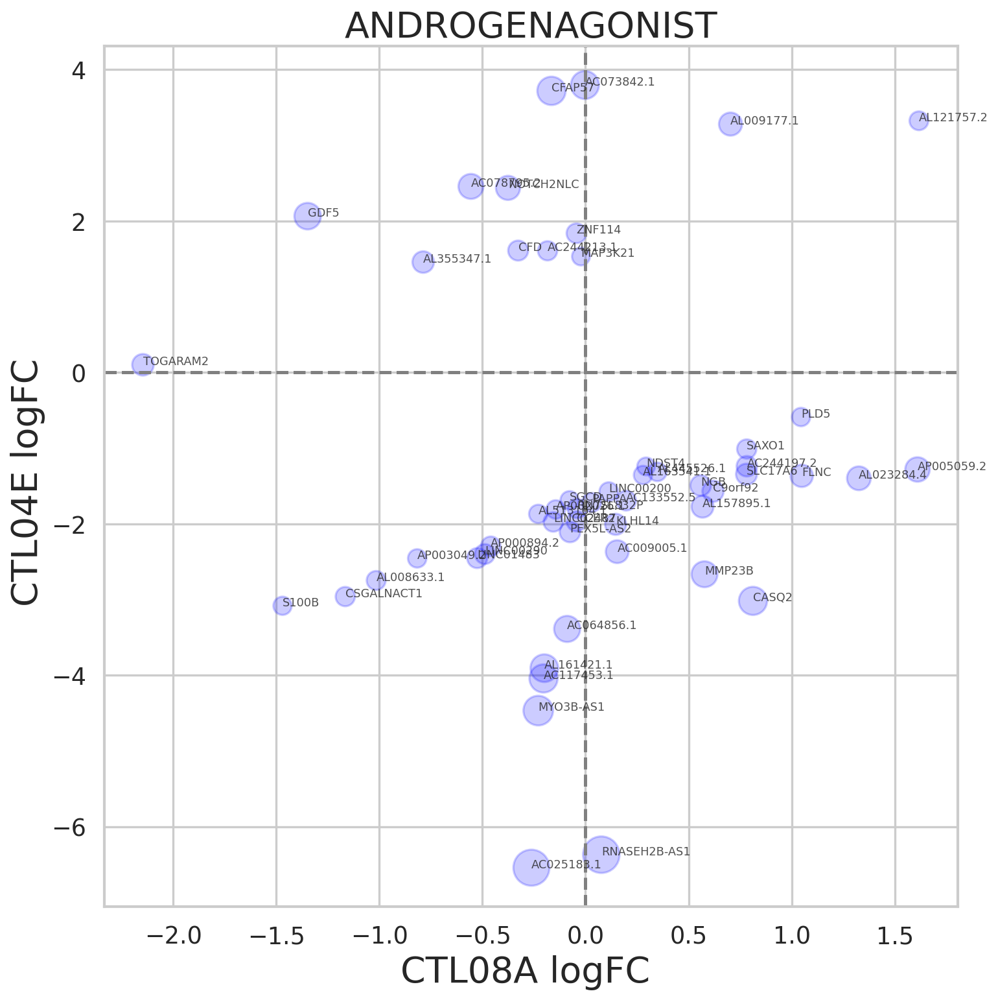

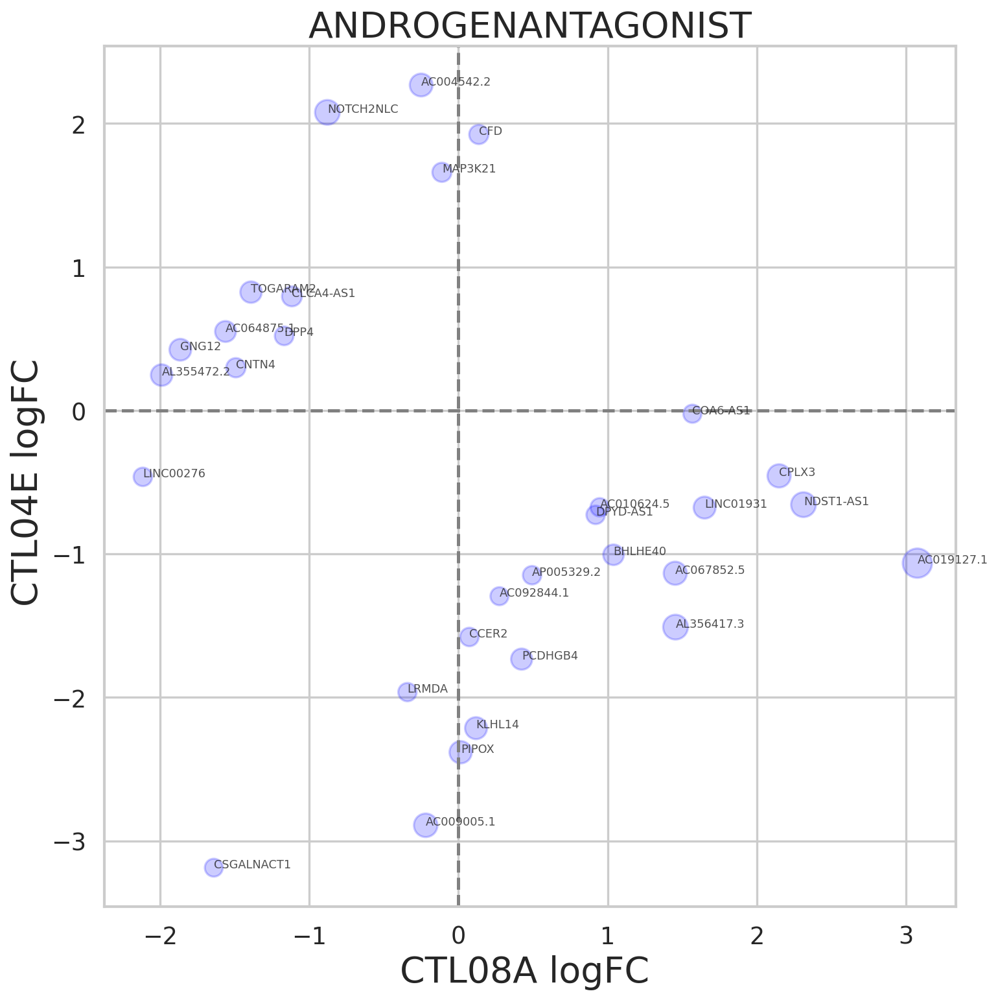

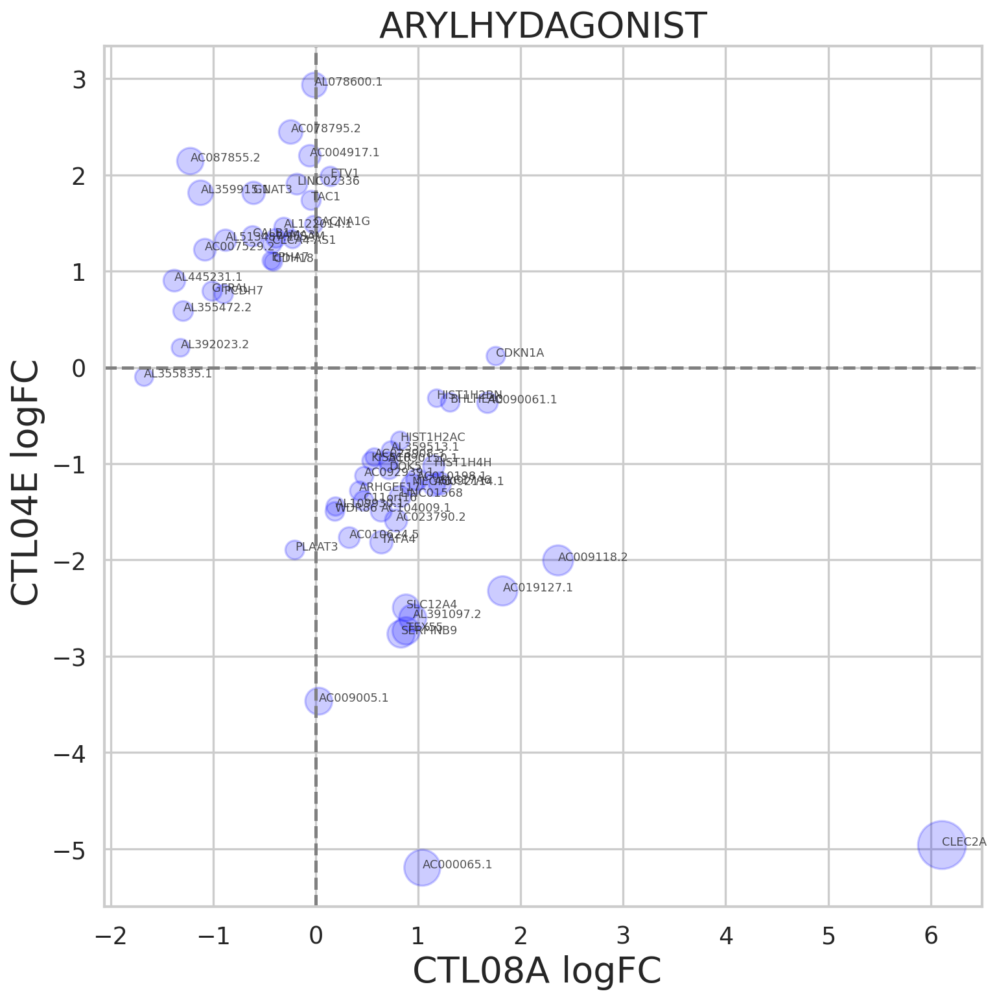

...

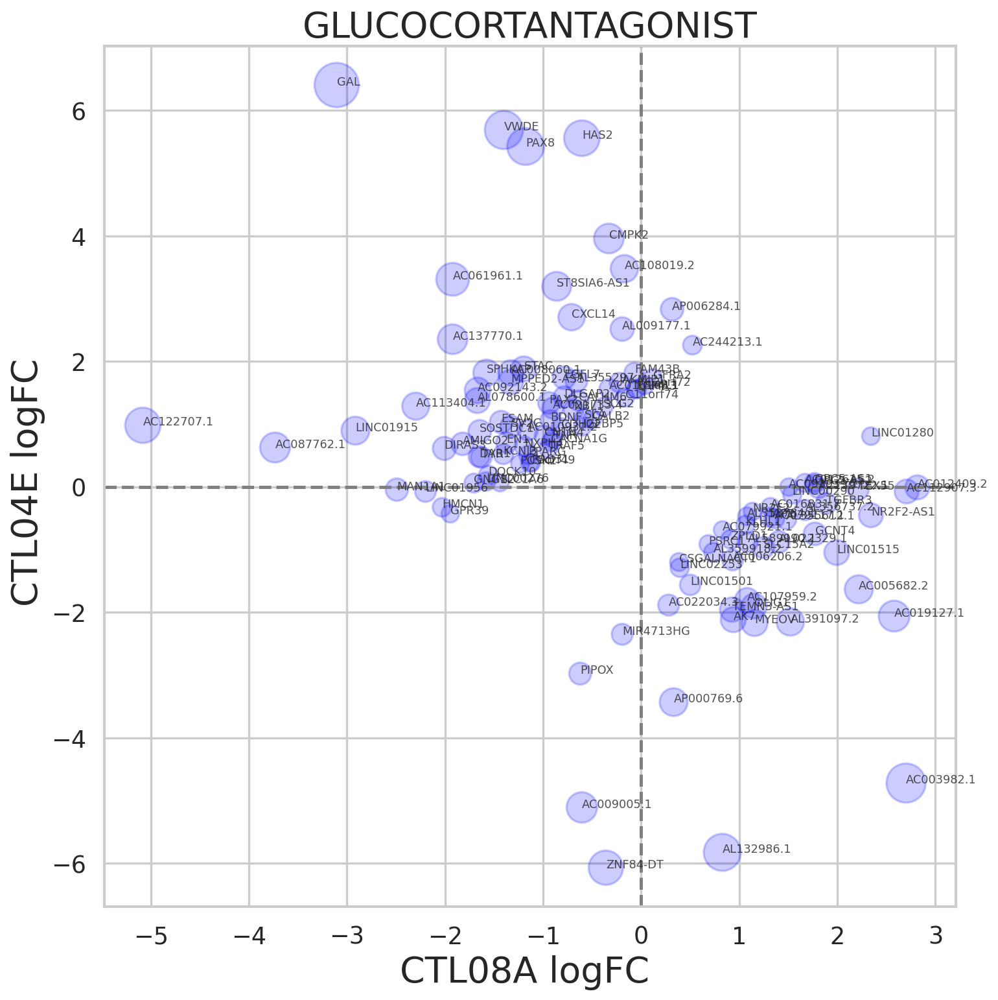

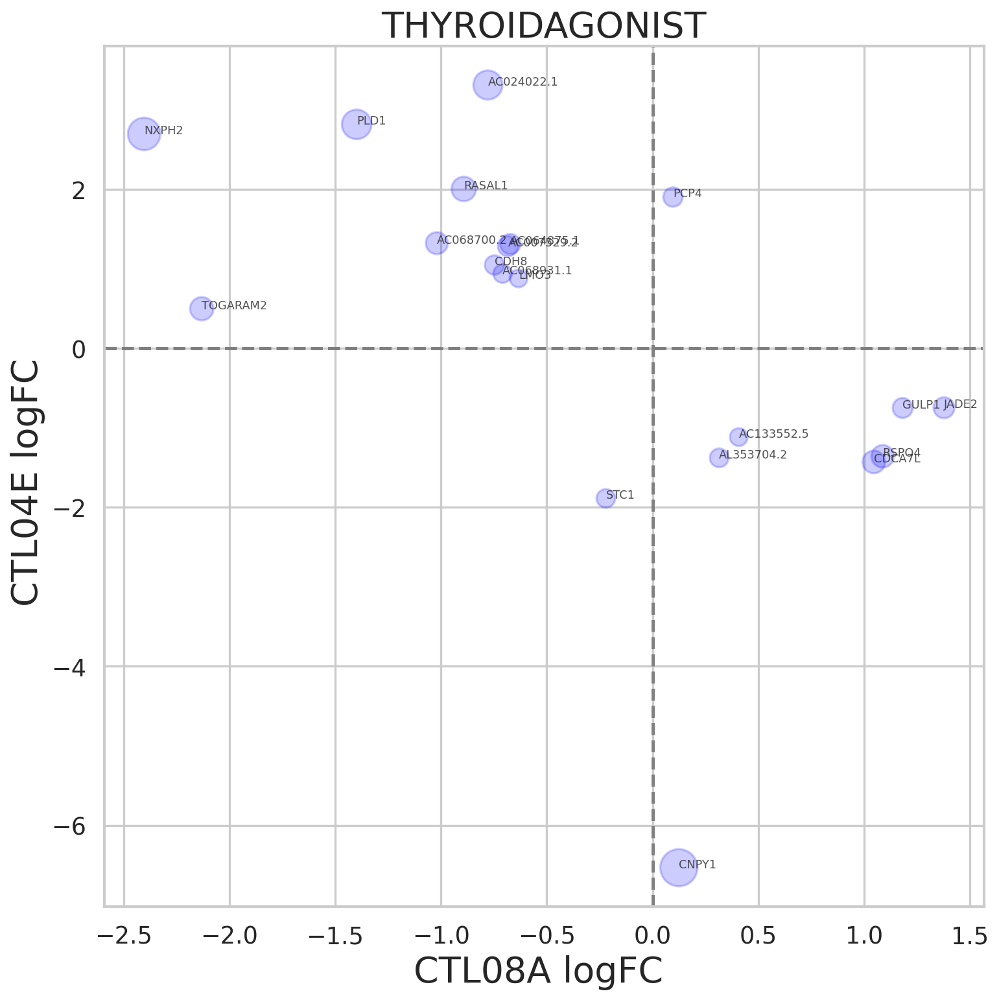

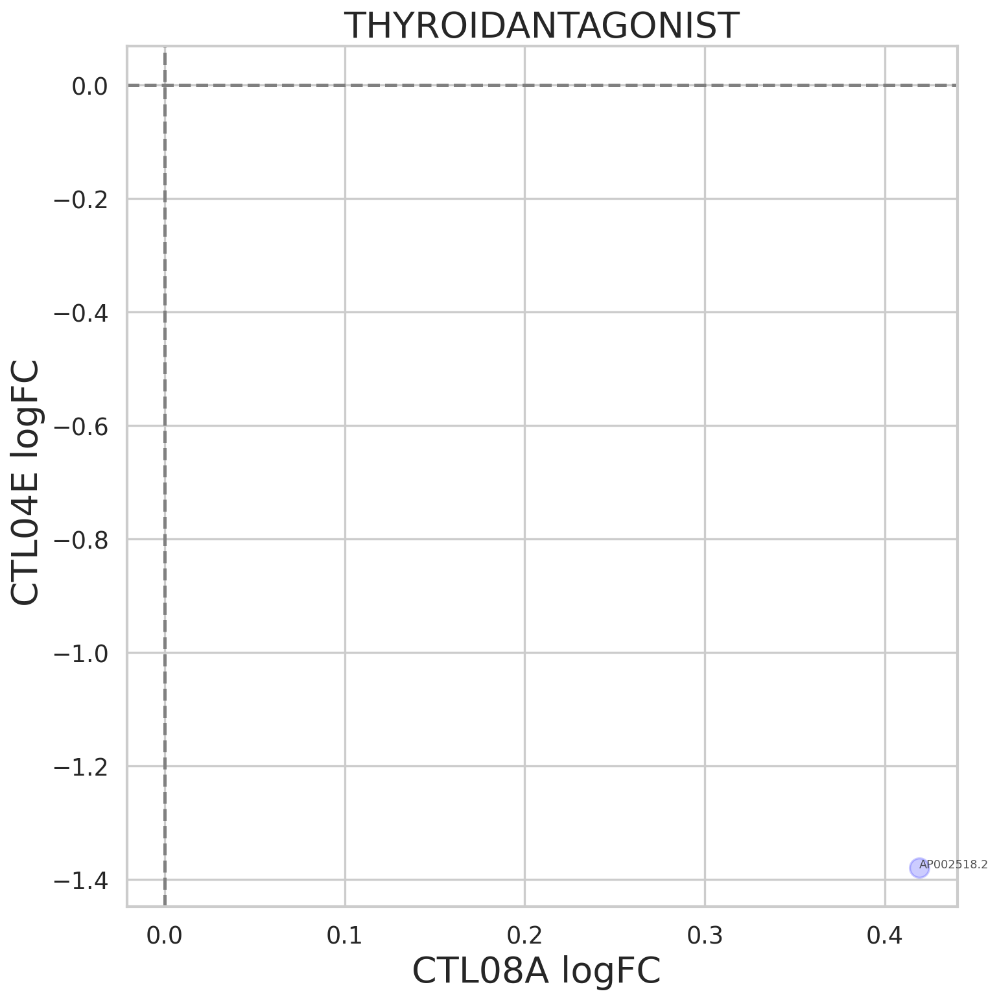

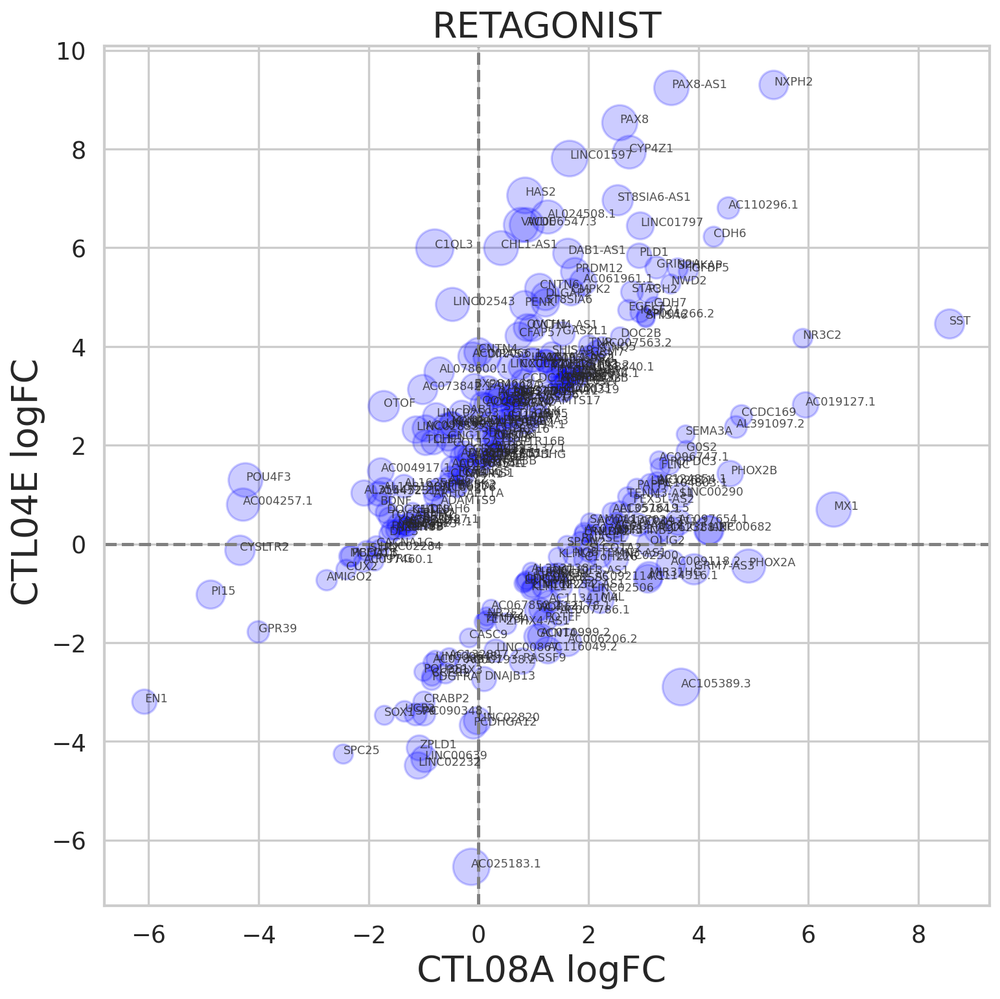

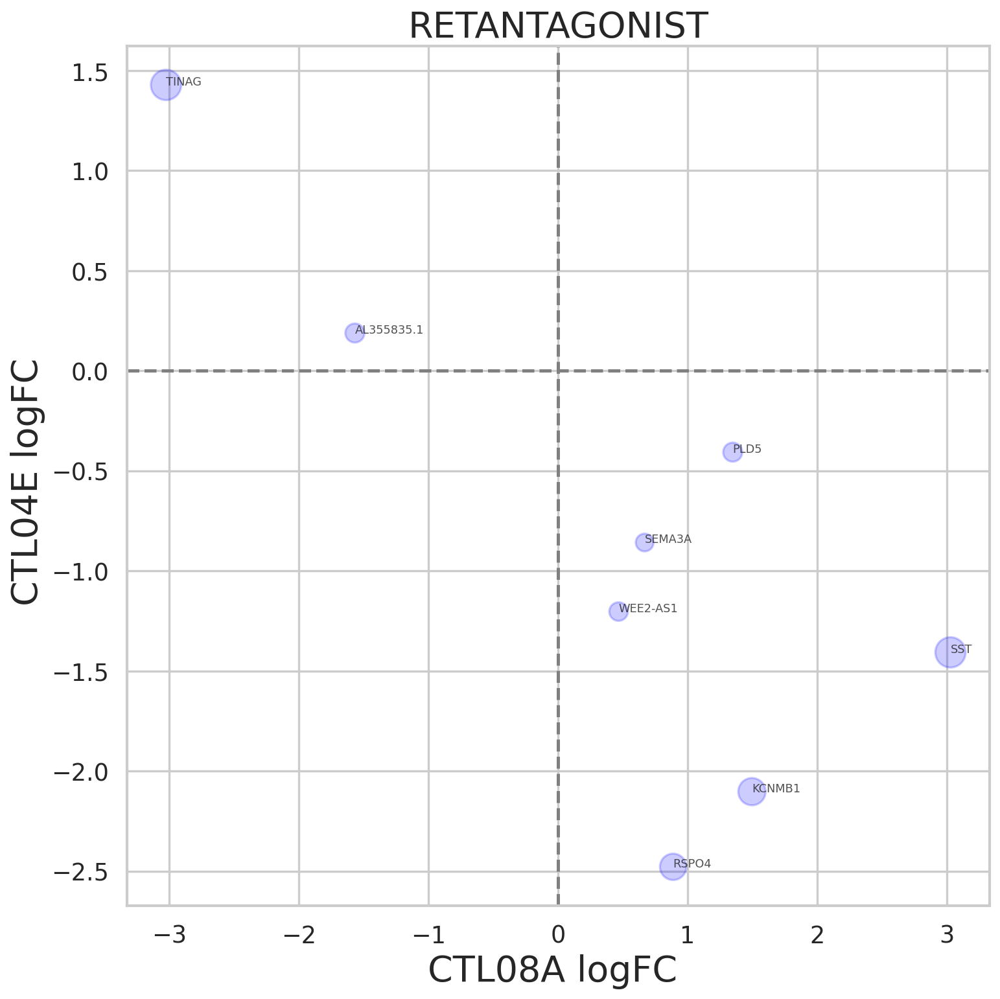

In [69]:
ScatterploDict = {}
for k in list(PerLineConditionVsDMSO.keys()):
    Compound = k.split(".")[0]
    if Compound not in list(ScatterploDict.keys()):
        ScatterploDict[Compound] = pd.DataFrame()
    Line = k.split("_")[-1]
    DF = PerLineConditionVsDMSO[k].assign(line=Line)
    DifferentiallyResponding = DifferentialEffectCompoundVsDMSO_filtered[f"{Compound}.VS.DMSO.DifferentialCTL04E-CTL08A"]
    DifferentiallyResponding = DifferentiallyResponding[abs(DifferentiallyResponding["logFC"]) >= 1.5]
    DifferentiallyResponding = DifferentiallyResponding[DifferentiallyResponding["FDR"] <= 0.05].genes.tolist()

    
    DF = DF[DF.genes.isin(DifferentiallyResponding)]

    ScatterploDict[Compound] = pd.concat([ScatterploDict[Compound], DF], ignore_index=True)
    ScatterploDict[Compound]



for Compound in list(ScatterploDict.keys()):
    # Assuming ScatterploDict[Compound] is your DataFrame
    df = ScatterploDict[Compound]

    # Pivot the DataFrame so that each gene is a row and you have one column per line
    df_pivot = df.pivot(index='genes', columns='line', values='logFC')

    # Optionally, drop genes that don't have logFC values for both lines
    df_pivot = df_pivot.fillna(0)

    if df_pivot.shape[0] == 0:
        print(f"No genes differentially regulated found for {Compound} according to selected filters")
        continue

    df_pivot["Delta"] = abs(df_pivot["CTL04E"] - df_pivot["CTL08A"])

    plt.figure(figsize=(10, 10))

    # Optionally scale the marker sizes (e.g., multiply Delta by a constant factor)
    marker_sizes = df_pivot["Delta"] * 100  # Adjust scaling factor as needed

    # Plot the scatter points using the correct parameter "s" for sizes
    plt.scatter(df_pivot['CTL08A'], df_pivot['CTL04E'], alpha=0.2, color='blue', s=marker_sizes)

    # Annotate each point with its gene name
    for gene in df_pivot.index:
        x = df_pivot.loc[gene, 'CTL08A']
        y = df_pivot.loc[gene, 'CTL04E']
        plt.text(x, y, gene, fontsize=8, alpha=0.8)

    # Draw reference lines at 0 (for 0-centered values)
    plt.axvline(0, color='gray', linestyle='--')
    plt.axhline(0, color='gray', linestyle='--')

    plt.xlabel('CTL08A logFC ', fontsize=25)
    plt.ylabel('CTL04E logFC ', fontsize=25)
    plt.title(Compound, fontsize=25)
    plt.tight_layout()
    plt.show()
